In [60]:
import geopandas as gpd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import networkx as nx
import osmnx as ox
import os
import pandas as pd
import numpy as np
import importlib
from tqdm import tqdm
from datetime import datetime
from osgeo import gdal, osr
import copy
import re

import helper_functions.utils
import helper_functions.flood_utils
import helper_functions.plot_utils
import helper_functions.routing.driving
import helper_functions.routing.dryRouting
import helper_functions.routing.floodedRouting
import helper_functions.routing.publicTransit

importlib.reload(helper_functions.utils)
importlib.reload(helper_functions.flood_utils)
importlib.reload(helper_functions.plot_utils)
importlib.reload(helper_functions.routing.driving)
importlib.reload(helper_functions.routing.dryRouting)
importlib.reload(helper_functions.routing.floodedRouting)
importlib.reload(helper_functions.routing.publicTransit)

import helper_functions.utils as utils
import helper_functions.flood_utils as flood_utils
import helper_functions.plot_utils as plot_utils
import helper_functions.routing.driving as driving
import helper_functions.routing.dryRouting as dryRouting
import helper_functions.routing.floodedRouting as floodedRouting
import helper_functions.routing.publicTransit as publicTransit

# Import car network

In [3]:
save_dir = os.path.join(os.getcwd(),"data")
filename = "SG_car_network.graphml"
G_car = ox.load_graphml(os.path.join(save_dir,filename))

# Import coastal flood map

In [4]:
# import slr 5m
slr_5m = r"C:\Users\hypak\OneDrive - Singapore Management University\Documents\Data\SG_SLR\Inundation_maps_5m\SGDEM36_slr_5.tif"
# slr_5m = gdal.Open(slr_5m, gdal.GA_ReadOnly)
slr_5m = gdal.Open(slr_5m)
print("Driver: {}/{}".format(slr_5m.GetDriver().ShortName,
                            slr_5m.GetDriver().LongName))
print("Size is {} x {} x {}".format(slr_5m.RasterXSize,
                                    slr_5m.RasterYSize,
                                    slr_5m.RasterCount))
print("Projection is {}".format(slr_5m.GetProjection()))
# get geotransform
geotransform5 = slr_5m.GetGeoTransform()
if geotransform5:
    print("Origin = ({}, {})".format(geotransform5[0], geotransform5[3]))
    print("Pixel Size = ({}, {})".format(geotransform5[1], geotransform5[5]))

band = slr_5m.GetRasterBand(1)
print("Band Type={}".format(gdal.GetDataTypeName(band.DataType)))

min_ = band.GetMinimum()
max_ = band.GetMaximum()
if not min_ or not max_:
    (min_,max_) = band.ComputeRasterMinMax(True)
print("Min={:.3f}, Max={:.3f}".format(min_,max_))
# read as array
slr_5m_arr = np.array(slr_5m.GetRasterBand(1).ReadAsArray())

# import slr 4m
slr_4m = r"C:\Users\hypak\OneDrive - Singapore Management University\Documents\Data\SG_SLR\Inundation_maps\SGDEM36_slr_4.tif"
# slr_4m = gdal.Open(slr_4m, gdal.GA_ReadOnly)
slr_4m = gdal.Open(slr_4m)
print("Driver: {}/{}".format(slr_4m.GetDriver().ShortName,
                            slr_4m.GetDriver().LongName))
print("Size is {} x {} x {}".format(slr_4m.RasterXSize,
                                    slr_4m.RasterYSize,
                                    slr_4m.RasterCount))
print("Projection is {}".format(slr_4m.GetProjection()))
# get geotransform
geotransform4 = slr_4m.GetGeoTransform()
if geotransform4:
    print("Origin = ({}, {})".format(geotransform4[0], geotransform4[3]))
    print("Pixel Size = ({}, {})".format(geotransform4[1], geotransform4[5]))

band = slr_4m.GetRasterBand(1)
print("Band Type={}".format(gdal.GetDataTypeName(band.DataType)))

min_ = band.GetMinimum()
max_ = band.GetMaximum()
if not min_ or not max_:
    (min_,max_) = band.ComputeRasterMinMax(True)
print("Min={:.3f}, Max={:.3f}".format(min_,max_))
# read as array
slr_4m_arr = np.array(slr_4m.GetRasterBand(1).ReadAsArray())

Driver: GTiff/GeoTIFF
Size is 1577 x 938 x 1
Projection is GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]
Origin = (103.60570070500017, 1.4707748320001883)
Pixel Size = (0.000277690658211731, -0.0002777556194030263)
Band Type=Float32
Min=0.010, Max=14.020
Driver: GTiff/GeoTIFF
Size is 1577 x 938 x 1
Projection is GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]
Origin = (103.60570070500017, 1.4707748320001883)
Pixel Size = (0.000277690658211731, -0.0002777556194030263)
Band Type=Float3

c:\Users\hypak\AppData\Local\anaconda3\envs\oxpy313\Lib\site-packages\osgeo\gdal.py:311: FutureWarning: Neither gdal.UseExceptions() nor gdal.DontUseExceptions() has been explicitly called. In GDAL 4.0, exceptions will be enabled by default.
  warnings.warn(


### Update traffic flow as an attribute to the major arterial roads

[LTA's Express way](https://www.lta.gov.sg/content/ltagov/en/getting_around/driving_in_singapore/expressways.html): 
- "And if you are going places – whether driving or via taxi or hired car – chances are that you will use one of the 10 expressways that span the island. ", 
- "They typically have three or more lanes in each direction and some run partially underground or even under water for faster, shorter and more more connected journeys. "

[Fan et al (1990)](https://www.sciencedirect.com/science/article/abs/pii/0191260790900517#:~:text=In%20addition%2C%20expressway%20capacity%20in,both%20UK%20and%20US%20practices.):
- In addition, expressway capacity in Singapore appears to be around 2400 passenger cars **per hour per lane**

#### Analysis
- Expressways in Singapore have at least 3 or more lanes, which means the capacity is likely to be between $2400 \times 3 = 7200$ and $2400 \times 4 = 9600$
- floods usually dissapate after 1 hour

##### Car analysis
- exclude smaller residential roads (below cat 3) because in the broader analysis context of travelling from region to planning area, people normally will not use the smaller residential roads unless specifically they are travelling to that particularly households
- so for the purpose of analysis, we will only be looking at flooded roads that affect roads that are at least cat 3 (cat3, cat4, cat5).
- if we only look at minor arterial roads (assumption is that all travelling has to go through minor arterial roads and the largest proportion of roads are minor arterial roads), then we can just use the traffic flow data.
    - sum up all the cat 3 (minor arterial roads)'s traffic flow in the destination planning area (the issue is we dunno how many cars in this planning area come from different parts of singapore). 
    - total cars in planning area (destination): $ car_{D} = \sum_i^N (car_{cat3,D})$, where $i$ represents a distinct cat3 road in a planning area, $N$ represents total number of cat3 roads in a planning area, $D$ represents the destination i.e. planning area,$cat3$ = minor arterial road, $car$ represents traffic flow. 
    - use the `spatialTravelPatterns` data to find the proportion of traffic flow (i.e. cars) coming from different regions of Singapore. Assumption is that number of cars is proportional to the number of people travelling from region to planning area, and the proportion of cars coming from different regions of Singapore should remain consistent across the time of the day e.g. 7 am - 9 am. 
    <!-- - Although number of cars is proportional to the number of people, we can assume average number of people in cars? $car_O = P_O/2$, where $P$ is the number of people travelling from region to planning area, $O$ is the origin. -->
    - Proportion of traffic flow: $\frac{P_O}{\sum P_O}$
    - then we will obtain the estimate of traffic flow from region to planning area:
        - $ cars_{OD} = \sum_i^N (car_{cat3,D}) \times \frac{P_O}{\sum P_O} $
    - calculate total travel time delay:
        - $ cars_{OD} \times T_{\{min, mean, max\}} $, where $T_{\{min, mean, max\}}$ represents the travel time delay statistics for the **affected routes** (i.e. routes that traverse at least one flooded road)


Another approach for calculating travel time delay:
- get the edges for routes that are flooded: $e \in {R_i,...,R_N}$, where $e$ are edges in the route $R_i$ that traverses at least one flooded
- match the edges with the edges of known traffic flow

length of max_traffic_flow: 1319


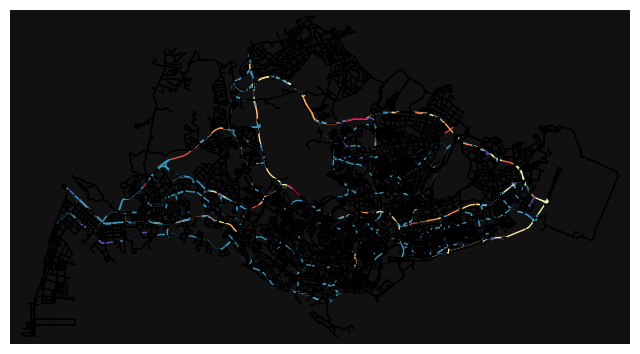

In [5]:
max_traffic_flow = pd.read_csv(r"C:\Users\hypak\OneDrive - Singapore Management University\Documents\Data\SG_LTA\trafficflow\max_traffic_flow.csv")
print("length of max_traffic_flow:", len(max_traffic_flow))
def update_traffic_flow(G,max_traffic_flow, plot=True):
    """ 
    Add attribute traffic_flow to G. 
    Traffic flow Returns hourly average traffic flow, taken from a representative month of every quarter during 0700-0900 hours.
    Args:
        G (G): driving route
        max_traffic_flow (pd.DataFrame)
        plot (bool): if True, plot traffic volume
    """
    G_copy = copy.deepcopy(G) # deep copy so it does not change the original
    # edges = ox.graph_to_gdfs(G_copy, nodes=False)
    start_edges = ox.distance.nearest_edges(G_copy,X = max_traffic_flow['StartLon'], Y = max_traffic_flow['StartLat'])
    end_edges = ox.distance.nearest_edges(G_copy,X = max_traffic_flow['EndLon'], Y = max_traffic_flow['EndLat'])
    max_traffic_flow['start_edges'] = start_edges
    max_traffic_flow['end_edges'] = end_edges
    assert len(start_edges) == len(end_edges) == len(max_traffic_flow), "length of edges must be the same as traffic flow df"
    # group by start_edges
    traffic_groupby = max_traffic_flow.groupby(['start_edges'])
    # group by start_edges and get the max traffic flow
    max_traffic_flow_dict = traffic_groupby['Volume'].max().to_dict() # returns a pd.Series
    # group by start_edges and get the first road name
    roadName_dict = traffic_groupby['RoadName'].first().to_dict() # returns a pd.Series
    # group by start_edges and get the first road cat
    roadCat_dict = traffic_groupby['RoadCat'].first().to_dict() # returns a pd.Series
    for u,v,key, data in G_copy.edges(data=True, keys=True):
        try:
            data['traffic_volume'] = max_traffic_flow_dict[(u,v,key)]
            data['RoadName'] = roadName_dict[(u,v,key)]
            data['RoadCat'] = roadCat_dict[(u,v,key)]
            # print(f"traffic vol: {max_traffic_flow_dict[(u,v,key)]}")
        except:
            pass
    
    if plot:
        # visualise the maxspeed
        # sort from lowest to highest max speed
        max_vol = max(max_traffic_flow_dict.values())
        min_vol = min(max_traffic_flow_dict.values())
        # get unique colours based on unique max speed
        iso_colors = ox.plot.get_colors(n=len(range(min_vol,max_vol+1)), cmap="Spectral_r", start=0,stop=1)
        # map colours according to the sorted maxspeed
        vol_color_map = {vol:col for vol, col in zip(range(min_vol,max_vol+1),iso_colors)}
        # map colours according to the G_copy's road's maxspeed
        ec = [vol_color_map[int(data['traffic_volume'])] if 'traffic_volume' in data.keys() else "black" for _, _, _, data in G_copy.edges(data=True, keys=True)]
        # plot the graph with colored edges
        fig, ax = ox.plot_graph(G_copy, edge_color=ec,node_size=0)
    return G_copy
G_car = update_traffic_flow(G_car,max_traffic_flow)

# Import LTA arrow markings
- Let LTA arrow marker be the proxy for the number of lanes on a road. 
- We want to infer the road category, and therefore traffic flow from the number of lanes

In [6]:
LTAarrow = gpd.read_file(r"C:\Users\hypak\OneDrive - Singapore Management University\Documents\Data\SG_LTA\LTAArrowMarkingGEOJSON.shp")
# LTAarrow = gpd.read_file(r"C:\Users\hypak\OneDrive - Singapore Management University\Documents\Data\SG_LTA\LTAArrowMarkingGEOJSON.geojson")

print("Length of LTAarrow: ", len(LTAarrow))
LTAarrow.head()

Length of LTAarrow:  106362


,Name,Descriptio,BEARG_NUM,TYP_CD,TYP_NAM,UNIQUE_ID,INC_CRC,FMEL_UPD_D,geometry
0,kml_1,<center><table><tr><th colspan='2' align='cent...,90,D,D - Straight,13433,E136BC628F895FC0,20220127100217,POINT Z (103.87445 1.34756 0)
1,kml_2,<center><table><tr><th colspan='2' align='cent...,268,C,C - St/Rt Turn,13434,A4A7E1C56B3ED571,20220127100217,POINT Z (103.87537 1.34752 0)
2,kml_3,<center><table><tr><th colspan='2' align='cent...,180,E,E - Lt Turn,13435,093A6AA8D0D400DD,20220127100217,POINT Z (103.8748 1.34787 0)
3,kml_4,<center><table><tr><th colspan='2' align='cent...,68,F,F - Lt/Rt Turn,6273,F4616A3E837CD763,20220127100215,POINT Z (103.88325 1.36507 0)
4,kml_5,<center><table><tr><th colspan='2' align='cent...,103,A,A - Right Turn,6274,0048AAC784A1A636,20220127100215,POINT Z (103.88291 1.36867 0)


# Infer road traffic volume
- [OSM highway tags](https://wiki.openstreetmap.org/wiki/Key:highway)
    - Rank of **road** importance: motorway > trunk > primary > secondary > tertiary > unclassified > residential
    - Rank of **link road** importance: motorway_link > trunk_link > primary_link > secondary_link > tertiary_link 
    - Rank of **special road types** importance: living_street > service > pedestrian > track > bus_guideway > escape > raceway

In [24]:
def infer_traffic_flow(G):
    edges = ox.graph_to_gdfs(G,nodes=False)
    def get_stats_trafficflow(row):
        d = row['traffic_volume'].describe().to_dict()
        return pd.Series(d, index=list(d))
    # return edges[~edges['traffic_volume'].isna()].groupby(['highway','lanes']).apply(lambda x: get_stats_trafficflow(x))
    edges['highway'] = edges['highway'].astype(str)
    edges['lanes'] = edges['lanes'].astype(str)
    # find the traffic flow for each type of highway and number of lanes on the road
    traffic_groupby = edges.groupby(['highway','lanes']).apply(lambda x: get_stats_trafficflow(x)).reset_index()
    print("lanes groupby: ", len(traffic_groupby))
    highway = traffic_groupby[~traffic_groupby['highway'].str.contains(",")]
    highway = highway[~highway['mean'].isna()]
    print("highway unique roads: ", highway['highway'].unique())
    lanes = traffic_groupby[~traffic_groupby['lanes'].str.contains(",")]
    lanes = lanes[~lanes['mean'].isna()]
    print("unique lanes: ", lanes['lanes'].unique())
    return highway, lanes

highway, lanes = infer_traffic_flow(G_car)
# highway.to_csv(os.path.join(r"data","traffic_volume_highway.csv"),index=False)
# lanes.to_csv(os.path.join(r"data","traffic_volume_lanes.csv"),index=False)

lanes groupby:  291
highway unique roads:  ['motorway' 'motorway_link' 'primary' 'primary_link' 'residential'
 'secondary' 'tertiary' 'tertiary_link' 'trunk' 'trunk_link'
 'unclassified']
unique lanes:  ['2' '3' '4' '5' '1' 'nan' '6']


C:\Users\hypak\AppData\Local\Temp\ipykernel_39224\3443270433.py:10: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  traffic_groupby = edges.groupby(['highway','lanes']).apply(lambda x: get_stats_trafficflow(x)).reset_index()


,,,osmid,highway,lanes,maxspeed,name,oneway,ref,reversed,length,bridge,geometry,speed_kph,travel_time,traffic_volume,RoadName,RoadCat,tunnel,junction,access,width
u,v,key,,,,,,,,,,,,,,,,,,,,
158016522,563800824,0,"[44361304, 134996386, 708727403, 134996381]","['motorway_link', 'motorway']","['2', '1']",50.0,Bukit Timah Expressway,True,BKE,False,817.392729,yes,"LINESTRING (103.7685 1.43577, 103.7685 1.43586...",50.0,58.852276,2814.0,BUKIT TIMAH EXPRESSWAY,CAT1,NaN,NaN,NaN,NaN
370322565,7117912425,0,"[123267232, 761826188, 711160771, 711160772]","['motorway_link', 'motorway']","['2', '3', '1']",50.0,"[Malaysia–Singapore Second Link, Tuas Checkpoi...",True,NaN,False,84.578926,yes,"LINESTRING (103.63445 1.34981, 103.63455 1.349...",50.0,6.089683,NaN,NaN,NaN,NaN,NaN,NaN,NaN
148124046,6136474362,0,"[641559970, 1183482556]","['motorway_link', 'primary']",1,60.0,Jalan Ahmad Ibrahim,True,NaN,False,201.282994,NaN,"LINESTRING (103.7282 1.32539, 103.72805 1.3252...",60.0,12.076980,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1345982270,566641881,0,"[479773704, 479773705, 121157363, 1295636131]","['motorway_link', 'primary']","['2', '1']",60.0,Jalan Ahmad Ibrahim,True,NaN,False,366.209468,NaN,"LINESTRING (103.72623 1.32525, 103.72739 1.325...",60.0,21.972568,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10736547914,139655079,0,"[634151306, 163139981, 479181294]","['motorway_link', 'primary']","['2', '1']",70.0,Whitley Road,True,NaN,False,509.542594,NaN,"LINESTRING (103.83599 1.32639, 103.83529 1.326...",70.0,26.205048,999.0,WHITLEY ROAD,CAT2,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8208598257,310043778,0,882664404,unclassified,nan,50.0,Loyang North Drive,False,NaN,True,697.660904,NaN,"LINESTRING (103.97359 1.37977, 103.97349 1.379...",50.0,50.231585,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11428211249,11428211250,0,"[1232097392, 1232097396]",unclassified,nan,50.0,NaN,False,NaN,True,39.552323,NaN,"LINESTRING (103.9265 1.36571, 103.92637 1.3657...",50.0,2.847767,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11428211250,369787193,0,1232097391,unclassified,nan,50.0,NaN,False,NaN,True,125.854163,NaN,"LINESTRING (103.92617 1.36584, 103.92572 1.366...",50.0,9.061500,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
max_traffic_flow[max_traffic_flow['RoadName'].str.contains('EXPRESSWAY')].groupby('RoadName')['Volume'].max().sort_values(ascending=False)

RoadName
PAN ISLAND EXPRESSWAY                   7992
BUKIT TIMAH EXPRESSWAY                  7920
SELETAR EXPRESSWAY                      7814
CENTRAL EXPRESSWAY                      7555
TAMPINES EXPRESSWAY                     7185
KRANJI EXPRESSWAY                       6837
AYER RAJAH EXPRESSWAY                   6356
KALLANG PAYA LEBAR EXPRESSWAY TUNNEL     999
KALLANG PAYA LEBAR EXPRESSWAY            986
Name: Volume, dtype: int64

### Import planning area

<class 'geopandas.geodataframe.GeoDataFrame'>


,Name,Description,geometry,PLN_AREA_N,PLN_AREA_C,CA_IND,REGION_N,REGION_C,INC_CRC,FMEL_UPD_D
0,kml_1,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.93208 1.30555 0, 103.93208 1.3...",BEDOK,BD,N,EAST REGION,ER,5F00E6FF084F3364,20191223152014
1,kml_2,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.72042 1.32824 0, 103.72003 1.3...",BOON LAY,BL,N,WEST REGION,WR,C96AED188C00B2FC,20191223152014
2,kml_3,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.76408 1.37001 0, 103.76444 1.3...",BUKIT BATOK,BK,N,WEST REGION,WR,3BEC4C829160F28A,20191223152014
3,kml_4,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.82361 1.26018 0, 103.82362 1.2...",BUKIT MERAH,BM,N,CENTRAL REGION,CR,4850795BB0B6A4F7,20191223152014
4,kml_5,<center><table><tr><th colspan='2' align='cent...,"POLYGON Z ((103.77445 1.39029 0, 103.77499 1.3...",BUKIT PANJANG,BP,N,WEST REGION,WR,656F87D23D6DAB02,20191223152014


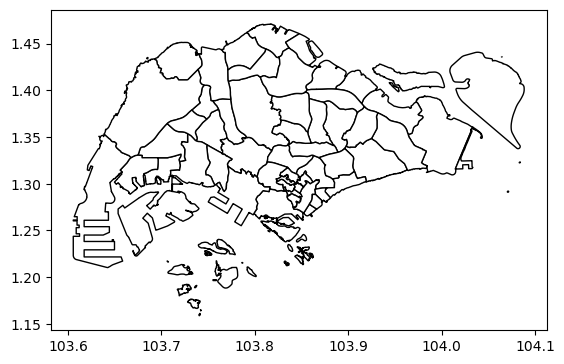

In [10]:
# planningArea_shp = gpd.read_file(r"C:\Users\hypak\OneDrive - Singapore Management University\Documents\Data\SG_Masterplan\MasterPlan2019_PlanningArea_Fixed.shp")
# planningArea_shp.plot(fc='white',ec='k')

from bs4 import BeautifulSoup 
planningArea_noSea = gpd.read_file(r"C:\Users\hypak\OneDrive - Singapore Management University\Documents\Data\SG_Masterplan\MasterPlan2019PlanningAreaBoundaryNoSea.geojson")

def extract_html_tags(row):
    html_content = row["Description"]
    soup = BeautifulSoup(html_content,"html.parser")
    ths = soup.find_all('th')
    tds = soup.find_all('td')
    column_names = []
    column_values = []
    for th in ths:
        column_names.append(th.get_text())
    for td in tds:
        column_values.append(td.get_text())
    column_names = column_names[1:] # remove the first "Attribute"
    return pd.Series({k:v for k,v in zip(column_names,column_values)})
# column_names, _ = extract_html_tags(planningArea_noSea.iloc[0,1])
planningArea_shp = planningArea_noSea.join(planningArea_noSea.apply(extract_html_tags,axis=1))
print(type(planningArea_shp))
planningArea_shp.plot(fc='white',ec='k')
planningArea_shp.head()

### Import work cluster

   PLN_AREA_N                  LU_DESC PLN_AREA_C     REGION_N REGION_C  \
44     TENGAH  EDUCATIONAL INSTITUTION         TH  WEST REGION       WR   

    latitude   longitude      node_ID                   geometry  
44  1.357293  103.733877  11717444138  POINT (103.73051 1.36398)  
Length of df:  50
Number of unique regions:  50


,PLN_AREA_N,LU_DESC,PLN_AREA_C,REGION_N,REGION_C,latitude,longitude,node_ID,geometry
2,BISHAN,COMMERCIAL,BS,CENTRAL REGION,CR,1.353185,103.838386,310582393,POINT (103.83839 1.35319)
5,BUKIT MERAH,COMMERCIAL,BM,CENTRAL REGION,CR,1.282412,103.823409,409638755,POINT (103.82341 1.28241)
7,BUKIT TIMAH,RESIDENTIAL WITH COMMERCIAL AT 1ST STOREY,BT,CENTRAL REGION,CR,1.333500,103.786494,6144151504,POINT (103.78649 1.3335)
12,DOWNTOWN CORE,UTILITY,DT,CENTRAL REGION,CR,1.286690,103.852118,7202314880,POINT (103.85212 1.28669)
13,GEYLANG,UTILITY,GL,CENTRAL REGION,CR,1.316940,103.885235,8655329609,POINT (103.88524 1.31694)


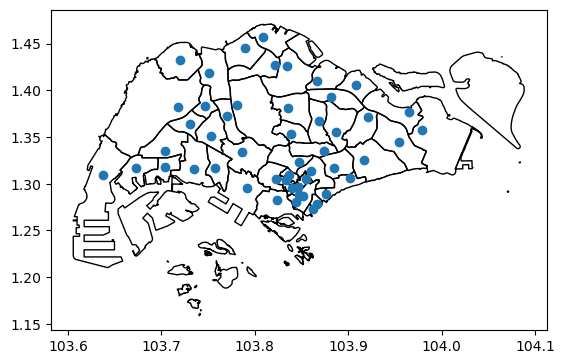

In [11]:
workplace_cluster = gpd.read_file(r"data\workplace_cluster_planningArea.shp")
# replace latitude and longitude coordinates for the row that corresponds to the PLN_AREA_N "TENGAH"
workplace_cluster.loc[workplace_cluster['PLN_AREA_N'] == 'TENGAH', ['latitude','longitude']] = [1.357293, 103.733877]
workplace_cluster.loc[workplace_cluster['PLN_AREA_N'] == 'TENGAH', 'node_ID'] = ox.distance.nearest_nodes(G_car,X = 103.733877, Y = 1.357293)
print(workplace_cluster[workplace_cluster['PLN_AREA_N'] == 'TENGAH'])
# planningArea_shp = gpd.read_file(r"C:\Users\hypak\OneDrive - Singapore Management University\Documents\Data\SG_Masterplan\MasterPlan2019PlanningAreaBoundaryNoSea.geojson")
workplace_cluster = workplace_cluster.sort_values(['REGION_N','PLN_AREA_N'])
print("Length of df: ",len(workplace_cluster.index))
print("Number of unique regions: ",len(workplace_cluster['PLN_AREA_C'].unique()))

# sembawang has index 36 1.456735,103.809257, node_ID = 6673057834
# update sembawang's coordinates and node_ID so that route can be found for car routing. Bus routing is not required as we are using OneMap API
workplace_cluster.loc[36,["latitude","longitude"]] = [1.450397, 103.802968]
workplace_cluster.loc[36,"node_ID"] = ox.nearest_nodes(G_car,X=workplace_cluster.loc[36,"longitude"],Y=workplace_cluster.loc[36,"latitude"])
#
ax = planningArea_shp.plot(fc="none",ec="k")
workplace_cluster.plot(ax=ax)
workplace_cluster.head()

# Mode of travel from region to planning area

In [12]:
spatialTravelPatterns = pd.read_csv(r"data\SpatialTravelPatterns.csv")
spatialTravelPatterns = spatialTravelPatterns.rename(columns={'Planning Area of Workplace':'end_PLN_AREA_N','Region':'start_REGION_N'})
spatialTravelPatterns['end_PLN_AREA_N'] = spatialTravelPatterns['end_PLN_AREA_N'].apply(lambda x: x.upper().strip())
spatialTravelPatterns['start_REGION_N'] = spatialTravelPatterns['start_REGION_N'].apply(lambda x: f"{x.upper()} REGION")
# skip the last 3 rows due to no data or combined data
spatialTravelPatterns = spatialTravelPatterns.iloc[:-3,:]
print("missing planning areas: ",set(planningArea_shp['PLN_AREA_N'])^set(spatialTravelPatterns['end_PLN_AREA_N']))
print("missing regions: ",set(planningArea_shp['REGION_N'])^set(spatialTravelPatterns['start_REGION_N']))
spatialTravelPatterns.head()

missing planning areas:  {'RIVER VALLEY', 'CHANGI BAY', 'WORKS FROM HOME', 'STRAITS VIEW', 'MARINA EAST', 'OTHER PLANNING AREAS OR OUTSIDE SINGAPORE', 'LIM CHU KANG', 'TENGAH', 'MANDAI', 'SIMPANG', 'CENTRAL WATER CATCHMENT', 'NORTH-EASTERN ISLANDS', 'NO FIXED LOCATION FOR WORK', 'MARINA SOUTH'}
missing regions:  set()


,end_PLN_AREA_N,start_REGION_N,Total,Combinations of MRT/LRT or Public Bus,Car/Taxi/Private Hire Car Only,Other Modes,No Transport Required
0,ANG MO KIO,CENTRAL REGION,7393,4385.0,2583.0,314.0,112.0
1,BEDOK,CENTRAL REGION,9637,5774.0,3027.0,703.0,132.0
2,BISHAN,CENTRAL REGION,7252,3553.0,1974.0,443.0,1282.0
3,BOON LAY,CENTRAL REGION,2252,975.0,1041.0,231.0,6.0
4,BUKIT BATOK,CENTRAL REGION,4954,2456.0,2155.0,250.0,93.0


# Proportion of car traffic flow from each region
- calculate traffic flow stats for each planning area

length of edges_vol:  45756
length of intersect df:  47309


C:\Users\hypak\AppData\Local\Temp\ipykernel_39224\3380957874.py:74: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  road_planningArea = road_planningArea.groupby([column_name]).apply(lambda x: traffic_stats(x)).reset_index()


,PLN_AREA_N,n_routes,min_traffic_volume,mean_traffic_volume,max_traffic_volume,sum_traffic_volume,end_PLN_AREA_N,CENTRAL REGION_prop,EAST REGION_prop,NORTH REGION_prop,NORTH-EAST REGION_prop,WEST REGION_prop,max_traffic_CENTRAL REGION,max_traffic_EAST REGION,max_traffic_NORTH REGION,max_traffic_NORTH-EAST REGION,max_traffic_WEST REGION
0,ANG MO KIO,1488.0,80.0,1678.822581,7814.0,104087.0,ANG MO KIO,0.193701,0.132508,0.160255,0.366179,0.147357,1513.577953,1035.420922,1252.232321,2861.324484,1151.444319
1,BEDOK,3380.0,52.0,1238.377551,6073.0,121361.0,BEDOK,0.181638,0.404860,0.068707,0.260966,0.083828,1103.088569,2458.717732,417.256826,1584.847105,509.089769
2,BISHAN,1086.0,98.0,932.772727,999.0,20521.0,BISHAN,0.245217,0.150932,0.119752,0.320248,0.163851,244.972174,150.780745,119.631801,319.928199,163.687081
3,BOON LAY,360.0,97.0,1246.523810,5173.0,26177.0,BOON LAY,0.177191,0.082723,0.089702,0.104170,0.546213,916.611574,427.928170,464.029106,538.872511,2825.558638
4,BUKIT BATOK,1022.0,9.0,1183.000000,5051.0,17745.0,BUKIT BATOK,0.193969,0.080468,0.109541,0.153105,0.462916,979.739424,406.444104,553.291359,773.334923,2338.190189


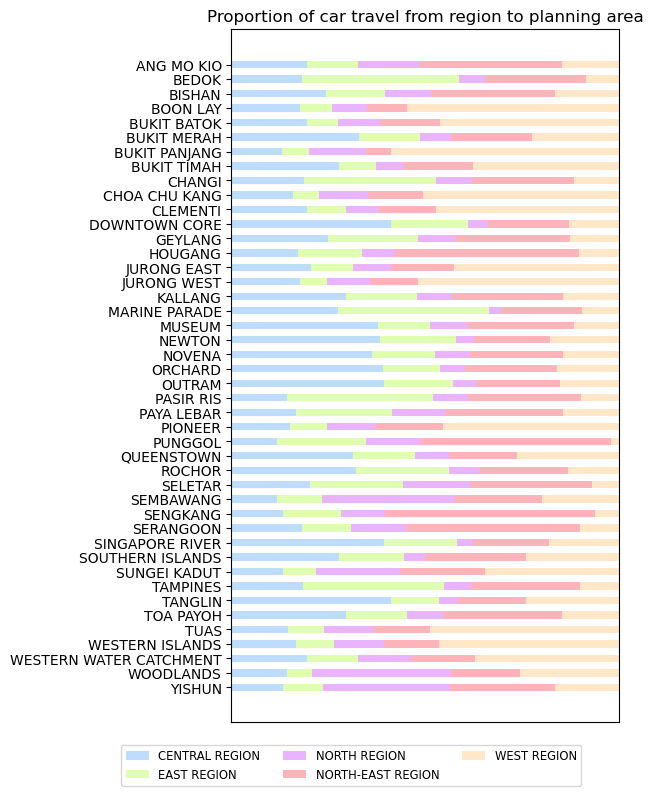

In [ ]:
def get_car_traffic_flow_proportion(spatialTravelPatterns,planningArea,plot=True,ax=None,title=""):
    """ calculate proportion of travel from each region 
    Args:
        spatialTravelPatterns (pd.DataFrame): 
        planningArea (geopandas.DataFrame):
        plot (bool): If True, plot stacked barplot
        ax (mpl.Axes): if None, supply a new figure, else draw on supplied axes
        title (str): title for plot
    """
    colors = {'EAST REGION':"#dffeb2","WEST REGION": "#ffe7c8","CENTRAL REGION":"#bedcfd",
                    'NORTH REGION':"#e9b3fd",'NORTH-EAST REGION':"#fdb3ba"}
    pivoted_df = spatialTravelPatterns.pivot(index='end_PLN_AREA_N',columns='start_REGION_N',values='Car/Taxi/Private Hire Car Only')
    pivoted_df['sum'] = pivoted_df.sum(axis=1)
    for region in pivoted_df.columns[:-1]:
        pivoted_df[f"{region}_prop"] = pivoted_df[region]/pivoted_df['sum']
    
    # select valid planning area rows
    intersection_pln = planningArea['PLN_AREA_N'][planningArea['PLN_AREA_N'].isin(pivoted_df.index)].sort_values().to_list()
    pivoted_df = pivoted_df.loc[intersection_pln,:]
    if plot:
        # y labels aka PLN_AREA_N
        labels = pivoted_df.index.to_list()
        category_names = pivoted_df.columns[-5:]
        category_colors = [colors[c.replace("_prop","")] for c in category_names]
        data = pivoted_df[category_names].values
        data_cum = data.cumsum(axis=1)
        if ax is None:
            fig, ax = plt.subplots(figsize=(5, 9))
        ax.invert_yaxis()
        ax.xaxis.set_visible(False)
        ax.set_xlim(0, np.sum(data, axis=1).max())

        for i, (colname, color) in enumerate(zip(category_names, category_colors)):
            widths = data[:, i]
            starts = data_cum[:, i] - widths
            colname = colname.replace("_prop","")
            rects = ax.barh(labels, widths, left=starts, height=0.5,
                            label=colname, color=color)
        ax.legend(ncols=3, bbox_to_anchor=(-0.3, -0.1),
                loc='lower left', fontsize='small')
        ax.set_title(title)

    return pivoted_df

def get_maxTrafficVol(G,planningArea,car_traffic_flow_proportion,column_name='REGION_N'):
    """ 
    We assume that all the cars (regardless where they are travelling, have to use this road that has the highest traffic flow)
    Map roads with known max traffic_volume to the corresponding planning area and region
    Args:
        G (G): driving route
        planningArea (gpd.GeoDataFrame): geopandas df of planning areas of SG
        car_traffic_flow_proportion (pd.Dataframe): dataframe that shows proportion of car travel from region to planning area
        column_name (str): name of column in planningArea to do the groupby
    """
    # exclude islands
    planningArea = planningArea[~planningArea['PLN_AREA_N'].str.contains('ISLAND')]
    edges_vol = ox.graph_to_gdfs(G, nodes=False)
    # find the intersection of each road to the planning area
    print("length of edges_vol: ",len(edges_vol))
    road_planningArea = edges_vol[['name','maxspeed','lanes','traffic_volume','geometry']].sjoin(planningArea,how='left',predicate='intersects')
    print("length of intersect df: ", len(road_planningArea))
    # group dataframe by origin i.e. REGION, and get the min, mean, and max traffic volume
    def traffic_stats(row):
        d = dict()
        # drop duplicates because one road may intersect with multiple planning area
        n_routes = len(row.index.drop_duplicates())
        d['n_routes'] = n_routes
        row = row[~row['traffic_volume'].isna()]
        d['min_traffic_volume'] = row['traffic_volume'].min()
        d['mean_traffic_volume'] = row['traffic_volume'].mean()
        d['max_traffic_volume'] = row['traffic_volume'].max()
        d['sum_traffic_volume'] = row['traffic_volume'].sum()
        return pd.Series(d, index=list(d))
    road_planningArea = road_planningArea.groupby([column_name]).apply(lambda x: traffic_stats(x)).reset_index()

    # merge traffic flow data with proportion of traffic from region to pln_area
    car_traffic_flow_proportion = car_traffic_flow_proportion.reset_index()
    regions = list(sorted(planningArea['REGION_N'].unique()))
    car_traffic_flow_proportion = car_traffic_flow_proportion[['end_PLN_AREA_N'] + [f"{r}_prop" for r in regions]]
    road_planningArea = road_planningArea.merge(car_traffic_flow_proportion,left_on='PLN_AREA_N',right_on='end_PLN_AREA_N')

    # calculate traffic volume originating from different regions
    # find the proportion of vehicles originating from regions using the max_traffic_volume,
    # taking the sum_traffic volume would be significantly overestimating the total number of cars at one time on the road
    for r in regions:
        region_prop = f"{r}_prop"
        road_planningArea[f"max_traffic_{r}"] = road_planningArea[region_prop]*road_planningArea['max_traffic_volume']

    
    return road_planningArea

car_traffic_flow_proportion = get_car_traffic_flow_proportion(spatialTravelPatterns,planningArea_shp,
                            title="Proportion of car travel from region to planning area")
car_traffic_flow_proportion.head()

# might good to visualise it in pie chart in arcgis with size of pie chart representing the size
maxTrafficVol = get_maxTrafficVol(G_car,planningArea_shp,car_traffic_flow_proportion,column_name='PLN_AREA_N')
# save to csv
# maxTrafficVol.to_csv(os.path.join(r"data","SpatialTravelPatterns_maxTrafficVol_planningArea.csv"),index=False)
maxTrafficVol.head()

### Import historical flood events

In [14]:
historical_floods = pd.read_csv(r"Flood_Weather_Data\precipitation_levels_during_flood_events.csv")
print(historical_floods.dtypes)
print("Length of df: ",len(historical_floods.index))
print("Number of unique flood events: ",len(historical_floods['matched_location'].unique()))
historical_floods.head()

flooded_location                  object
responses_found                    int64
matched_location                  object
latitude                         float64
longitude                        float64
closest_weather_stn               object
mean_pr                          float64
daily rainfall total (mm)        float64
highest 30 min rainfall (mm)     float64
highest 60 min rainfall (mm)     float64
highest 120 min rainfall (mm)    float64
drainage_catchment                object
time                              object
dtype: object
Length of df:  220
Number of unique flood events:  144


,flooded_location,responses_found,matched_location,latitude,longitude,closest_weather_stn,mean_pr,daily rainfall total (mm),highest 30 min rainfall (mm),highest 60 min rainfall (mm),highest 120 min rainfall (mm),drainage_catchment,time
0,Yishun MRT,9,ATM DBS YISHUN MRT STATION,1.429525,103.834995,Yishun,17.395082,45.0,40.8,44.0,44.2,Woodlands,2014-03-20
1,2 KAKI BUKIT ROAD 3,1,2 KAKI BUKIT ROAD 3 SINGAPORE 417817,1.337334,103.901943,Tai Seng,7.993548,25.0,21.0,25.0,25.0,Geylang,2014-04-04
2,PSC Building,1,PSC BUILDING,1.328863,103.706189,Boon Lay (West),14.574603,89.5,49.5,83.0,89.0,Jurong,2014-04-23
3,21229 (bus stop),1,21229 (BUS STOP),1.342064,103.716020,Jurong (North),14.574603,65.4,51.6,63.8,65.4,Jurong,2014-04-23
4,Tengah Flyover,1,TENGAH FLYOVER,1.363822,103.707043,Jurong (North),22.195238,92.6,50.2,78.4,92.2,Kranji,2014-05-16


### Import historical weather data

In [15]:
imported_data_dir = os.path.join(os.getcwd(),"Flood_Weather_Data")
percentiles, historical_ppt_percentiles = flood_utils.get_historical_ppt_percentiles(fp=os.path.join(imported_data_dir,"historical_weather.csv"),
                                                                         percentiles=[90,95,99,99.9])
print(percentiles)
print(historical_ppt_percentiles)

[90, 95, 99, 99.9]
{'highest 30 min rainfall (mm)': array([13.8, 21.2, 35.6, 51.4]), 'highest 60 min rainfall (mm)': array([17.    , 26.8   , 47.2   , 70.4767]), 'highest 120 min rainfall (mm)': array([19. , 30.2, 55. , 85. ])}


# Car dry isochrone

In [5]:
# get car_itinerary_df
CT = driving.CarTrip(G_car, workplace_cluster,planningArea=planningArea_shp)
car_itinerary_df = CT.get_itinerary_entry(cost="travel_time")
# car_itinerary_df.to_csv(r"data\car_routing_osmnx_planningArea.csv",index=False)
# sembawang_itinerary = car_itinerary_df[car_itinerary_df['end_PLN_AREA_N'] == "SEMBAWANG"]
# sembawang_itinerary
# ISO = dryRouting.PlotIsochrone(G_car,car_itinerary_df,planningArea_shp)
# ISO.plot_shortest_path_route(sembawang_itinerary,column_value="simulated_total_duration",
#                                             flooded_edges=None,ax=None,
#                                             cbar=None)
# car_itinerary_df = pd.read_csv(r"data\car_routing_osmnx_planningArea.csv")
print("Length of df: ",len(car_itinerary_df.index))
car_itinerary_df.head()

Length of df:  1191450


,start_nodesID,simulated_total_duration,end_nodesID,end_lat,end_lon,start_lat,start_lon,start_PLN_AREA_N,start_PLN_AREA_C,start_REGION_N,start_REGION_C,start_merge,end_PLN_AREA_N,end_PLN_AREA_C,end_REGION_N,end_REGION_C,end_merge
0,310582393,0.000000,310582393,1.353185,103.838386,1.352775,103.838434,BISHAN,BS,CENTRAL REGION,CR,both,BISHAN,BS,CENTRAL REGION,CR,both
1,310582364,20.144174,310582393,1.353185,103.838386,1.353730,103.837096,BISHAN,BS,CENTRAL REGION,CR,both,BISHAN,BS,CENTRAL REGION,CR,both
2,310582069,26.346668,310582393,1.353185,103.838386,1.353910,103.836503,BISHAN,BS,CENTRAL REGION,CR,both,BISHAN,BS,CENTRAL REGION,CR,both
3,310582078,29.106949,310582393,1.353185,103.838386,1.354134,103.836657,BISHAN,BS,CENTRAL REGION,CR,both,BISHAN,BS,CENTRAL REGION,CR,both
4,1601017000,30.845068,310582393,1.353185,103.838386,1.353464,103.836448,BISHAN,BS,CENTRAL REGION,CR,both,BISHAN,BS,CENTRAL REGION,CR,both


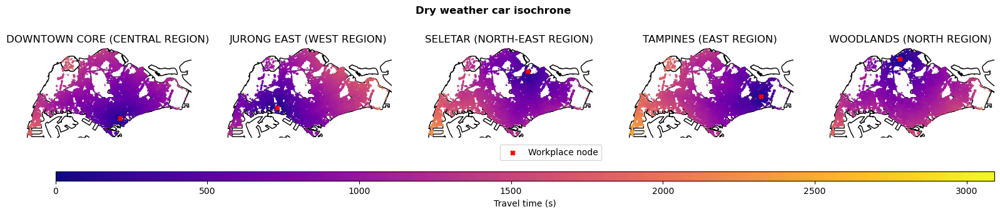

In [6]:
ISO = dryRouting.PlotIsochrone(G_car,car_itinerary_df,planningArea_shp)
itinerary_df_list = ISO.get_grouped_itinerary_df(groupby_name="end_PLN_AREA_N")
# check if there are any NaN values in the itinerary_df_list
n_distinct_routes = len(set([len(v) for v in itinerary_df_list.values()]))
if n_distinct_routes > 1:
    print("There are multiple distinct OD car routes. This may indicate that some routes are not connected or have NaN values.")
# filter representative planning area isochrones for each administrative region
selected_planningArea = ['TAMPINES','JURONG EAST','WOODLANDS','DOWNTOWN CORE','SELETAR']
selected_itinerary = {k:df for k,df in itinerary_df_list.items() 
                      if k in selected_planningArea}
# name of saved figure
save_fp = os.path.join(r"data\floodRouting","dry_isochrone_car_workClusters.png")
# plot isochrone
ISO.plot_isochrone(selected_itinerary, flooded_edges=None,
                   column_value="simulated_total_duration",
                   colorbar_label="Travel time (s)", ncols = len(list(selected_itinerary)),
                   title="Dry weather car isochrone",
                   cbar_orientation="horizontal",
                   save_fp=save_fp)

TODO: 

#### Raster analysis
- Map raster inundation map over edges in `G_car` and `G_bus`, pixel by pixel (coord by coord), and add the pixel value (i.e. flood depth) as an attribute `flood_depth` to the edges
    - obtain the geographical coordinates of each pixel's centroid (it may be possible that 1 pixel cover multiple roads, so use pixel centroid instead) and their flood depth
    - obtain closest edge (road) based on coords
- Update edges' attributes - `max_speed` and `travel_time` 

#### Vector/point analysis
If there is no raster inundation map, we will just look at the roads that were flooded at these scenarios - 90th, 95th, 99th, and 99.9th percentile for the max 30 mins rainfall
- Use the `precipitation_levels_during_flood_events.csv` to identify all the roads that have been flooded (in recent times e.g. >=2020) for each rainfall type percentile
- identify relevant road edges for each scenario
- Update edges' attributes - `max_speed` and `travel_time` 

**Rerun flood risk analysis for 2014 to 2024**

1. Can we find out which bus sevices are most likely to be impacted?
2. Can we identify the critical road segments that result in the highest time delay?

# Vector impact travel time analysis

### Identify flooded roads by rain percentile

TODO:
- convert rainfall percentile values to 1 in ? return period of rainfall. We do not have a 1 in ? year of flood event as pluvial flood drain out pretty fast. PUB does have a drainage code of practice that can handle a 1 in 100 year flood.
- for each derived flooded roads for **rainfall value** and **rainfall type**, update the speed and travel time.
- **Determining travel speed during flooding**: sort travel speed bands in `TravelSpeedBands.*.csv` to obtain the lowest speed band during a rainfall event. Select a representative road and obtain the respective speed band e.g. Ang mo kio ave 4 has speed band 2, which corresponds to *10-19km/h*
- identify critical road segments that needs prioritisation of flood risk reduction (i.e. identify the road segment that creates the highest time delay when flooded)
- identify which roads have the highest likelihood of flood?

- Scenarios analysis:
    - speed changes based on flood depth e.g. [Pregnolato et al (2017)](https://www.sciencedirect.com/science/article/pii/S1361920916308367) proposed a depth-disruption function to estimate a relationship between road inundation depth and traffic disruption based on existing empirical studies. *Note*: Only achievable if we have the flood inundation raster map
    - flood depth > 15 - 40 cm, cars stall, road takes 30 - 60 minutes to drain out water. Minimum delay is the delay that it takes for the water to drain away from the road i.e. at most 1 hour.
    - Train routing, which train stations are the most critical which creates the highest time delay when flooded?

# Compute global flooded roads
1. Compute global flooded roads by considering that multiple roads flood simultaneously

TODO:

2. Compute flooded roads individually to do a sensitivity analysis

3. Find the road that has the highest betweeness and centrality score

4. Simulate road closures on critical roads `G.remove_edge(u,v)`

### Get flooded edges

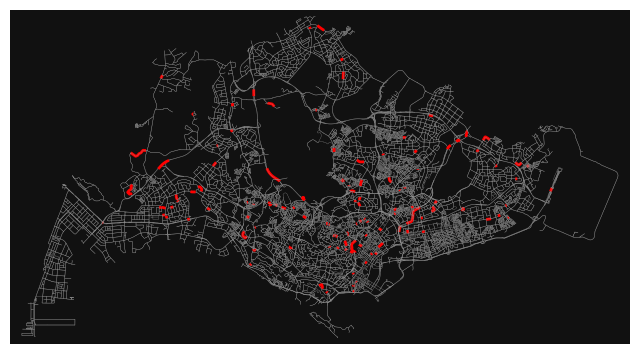

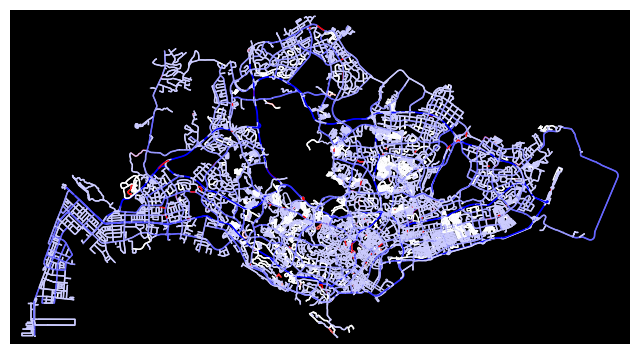

In [14]:
UFN = floodedRouting.UpdateFloodNetwork(G_car, flooded_maxspeed=10,percentage_reduction_maxspeed=None)
# show flooded edges
flooded_edges = UFN.identify_flooded_roads(historical_floods,51,rf_type='highest 30 min rainfall (mm)',plot=True,
                                           flooded_edge_color="red",edge_color="#999999")
# show updated network road speed
UFN.update_flooded_road_network(flooded_edges, cmap="bwr_r",node_size=0,bgcolor="black")

In [ ]:
edges = ox.graph_to_gdfs(G_car, nodes=False)
print(edges.columns)
traffic_flow_edges = edges[~edges['traffic_volume'].isna()].index.to_list()
print("length of traffic flow edges: ", len(traffic_flow_edges))
print("flooded edges: ", len(flooded_edges))
edges.loc[list(set(traffic_flow_edges) & set(flooded_edges)),["name","lanes","maxspeed","traffic_volume"]]

Index(['osmid', 'highway', 'lanes', 'maxspeed', 'name', 'oneway', 'ref',
       'reversed', 'length', 'bridge', 'geometry', 'speed_kph', 'travel_time',
       'traffic_volume', 'tunnel', 'junction', 'access', 'width'],
      dtype='object')
length of traffic flow edges:  964
flooded edges:  176


,,,osmid,highway,lanes,maxspeed,name,oneway,ref,reversed,length,bridge,geometry,speed_kph,travel_time,traffic_volume,tunnel,junction,access,width
u,v,key,,,,,,,,,,,,,,,,,,
244893860,244919173,0,"[660363809, 173767941, 635732840, 464289067, 6...",primary,"[5, 4, 3]",60.0,Yishun Avenue 2,True,NaN,False,616.487339,NaN,"LINESTRING (103.83507 1.42482, 103.83507 1.424...",60.0,36.989240,NaN,NaN,NaN,NaN,NaN
243674568,243674565,1,"[22718625, 633798275, 655149255, 749559660, 63...",tertiary,4,50.0,Kaki Bukit Avenue 2,False,NaN,False,291.037803,NaN,"LINESTRING (103.90048 1.33592, 103.90053 1.336...",50.0,20.954722,NaN,NaN,NaN,NaN,NaN
246144661,5965615376,0,"[481621520, 631756049, 710471390, 481621519]",secondary,"[2, 5]",60.0,International Road,True,NaN,False,226.046813,NaN,"LINESTRING (103.70594 1.32781, 103.70656 1.327...",60.0,13.562809,NaN,NaN,NaN,NaN,NaN
158067840,158043992,0,536096908,motorway,3,90.0,NaN,True,KJE,False,1109.064656,NaN,"LINESTRING (103.71085 1.3669, 103.71061 1.3668...",90.0,44.362586,987.0,NaN,NaN,NaN,NaN
246144661,5965615376,0,"[481621520, 631756049, 710471390, 481621519]",secondary,"[2, 5]",60.0,International Road,True,NaN,False,226.046813,NaN,"LINESTRING (103.70594 1.32781, 103.70656 1.327...",60.0,13.562809,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232105763,232082907,0,"[176296657, 635637137, 634493593, 649396367]",trunk,5,60.0,Ophir Road,True,NaN,False,227.933558,NaN,"LINESTRING (103.8579 1.30125, 103.85794 1.3012...",60.0,13.676013,NaN,NaN,NaN,NaN,NaN
1366619069,1366618974,0,122258967,residential,2,40.0,Puay Hee Avenue,False,NaN,True,227.515187,NaN,"LINESTRING (103.87122 1.33165, 103.87154 1.331...",40.0,20.476367,NaN,NaN,NaN,NaN,NaN
4711976941,244921830,0,"[1318963912, 667387626]",primary,3,60.0,Yishun Avenue 7,True,NaN,False,239.310958,NaN,"LINESTRING (103.83321 1.4385, 103.83371 1.4387...",60.0,14.358658,NaN,NaN,NaN,NaN,NaN


# Pluvial flood routing

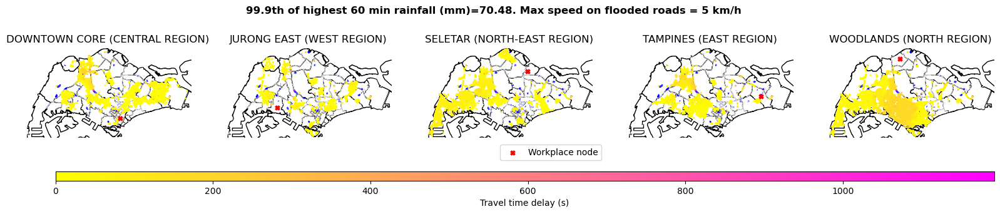

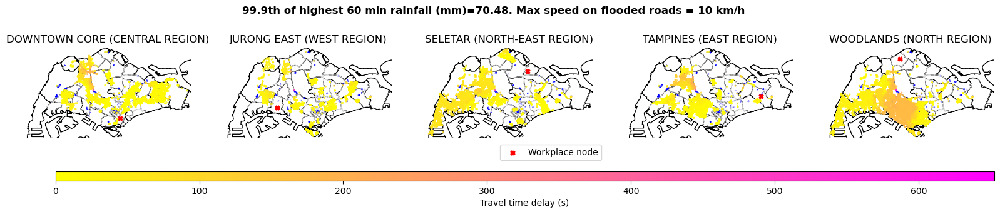

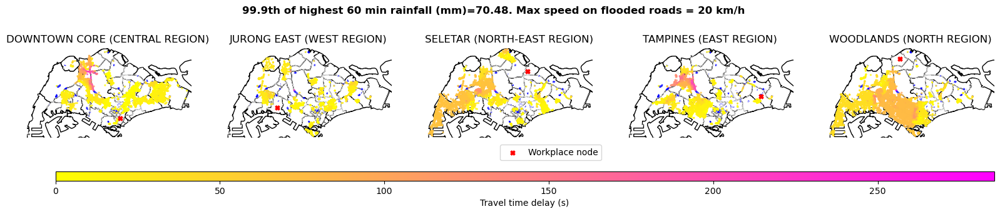

In [12]:
# parameter inputs
save_dir = r"data\floodRouting"
# rainfall params
rf_type = 'highest 60 min rainfall (mm)' # max 1 hour rainfall intensity
rf_perc = 99.9
rf_map = {perc:rf_val for perc, rf_val in zip(percentiles,list(historical_ppt_percentiles[rf_type]))}
rf_value = rf_map[rf_perc]
# filter planning areas to plot
selected_planningArea=['TAMPINES','JURONG EAST','WOODLANDS','DOWNTOWN CORE','SELETAR']
# speed params
# flooded_maxspeed = None # km/h
percentage_reduction_maxspeed = None #50 # %
for flooded_maxspeed in [5,10,20]:
# for percentage_reduction_maxspeed in [10,20,50,80]:
    # get flooded edges
    UFN = floodedRouting.UpdateFloodNetwork(G_car, flooded_maxspeed=flooded_maxspeed,
                                            percentage_reduction_maxspeed=percentage_reduction_maxspeed)
    # show flooded edges
    flooded_edges = UFN.identify_flooded_roads(historical_floods,rf_value,rf_type=rf_type,plot=False,
                                            flooded_edge_color="red",edge_color="#999999")

    # save fp for itinerary df, and title for plots
    if flooded_maxspeed is not None:
        filename0 = f"car_routing_rfType{rf_type}_rfPerc{rf_perc}_maxspeed{flooded_maxspeed}.csv"
        title = f"{rf_perc}th of {rf_type}={rf_value:.2f}. Max speed on flooded roads = {flooded_maxspeed} km/h"
    if percentage_reduction_maxspeed is not None:
        filename0 = f"car_routing_rfType{rf_type}_rfPerc{rf_perc}_percReducMaxspeed{percentage_reduction_maxspeed}.csv"
        title = f"{rf_perc}th of {rf_type}={rf_value:.2f}. Speed reduction = {percentage_reduction_maxspeed}%"

    save_fp = os.path.join(save_dir,filename0)
    # itinerary df is derived from identifying flooded roads from historically flooded roads, and update travel speed and time in G
    itinerary_df = UFN.get_flooded_car_df(workplace_cluster,planningArea_shp,flooded_edges,
                                        save_fp=save_fp, cost="travel_time")

    # import data and read data
    # flooded itinerary
    car_flooded_df = pd.read_csv(save_fp)
    # non flooded itinerary
    car_dry_df = pd.read_csv(os.path.join(os.getcwd(),"data","car_routing_osmnx_planningArea.csv"))

    TTD = floodedRouting.TravelTimeDelay(car_flooded_df,car_dry_df,planningArea_shp,
                                        column_value="simulated_total_duration",
                                        end_groupby="end_PLN_AREA_N",
                                        start_groupby="start_REGION_N")

    # compute travel time delay by comparing the difference in dry_df and flooded_df
    travel_time_delay_df = TTD.compute_travel_time_delay()
    # group itinerary based on end_PLN_AREA_N
    itinerary_df_list = TTD.get_grouped_travel_time_delay(travel_time_delay_df)
    # filter grouped itinerary based on selected planning areas
    selected_itinerary = {k:df for k,df in itinerary_df_list.items() 
                        if k in selected_planningArea}
    # get stats
    filename = filename0.replace("routing","stats")
    save_fp = os.path.join(save_dir,filename)
    travelTimeDelay_stats_df = TTD.get_stats_travel_time_delay(travel_time_delay_df, save_fp=save_fp)

    # plot isochrone
    filename = filename0.replace("routing","isochrone_timeDelay").replace(".csv",".png")
    save_fp = os.path.join(save_dir,filename)
    ISO = dryRouting.PlotIsochrone(G_car,travel_time_delay_df,planningArea_shp)
    ISO.plot_isochrone(selected_itinerary,flooded_edges=flooded_edges,
                        column_value="travel_time_delay",
                        cmap="spring_r",flooded_edge_color="blue",
                        colorbar_label="Travel time delay (s)", title=title,
                        save_fp=save_fp)

# Coastal flood routing

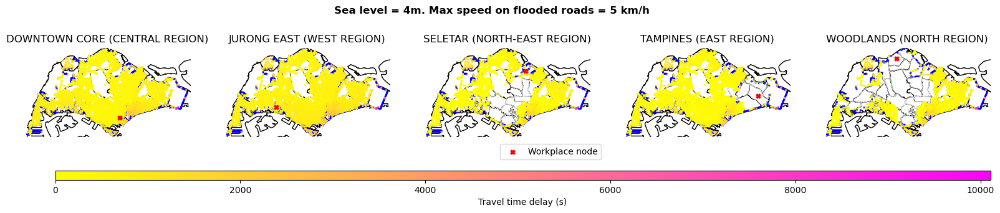

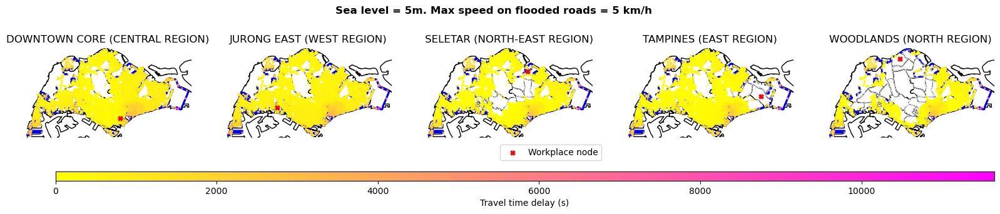

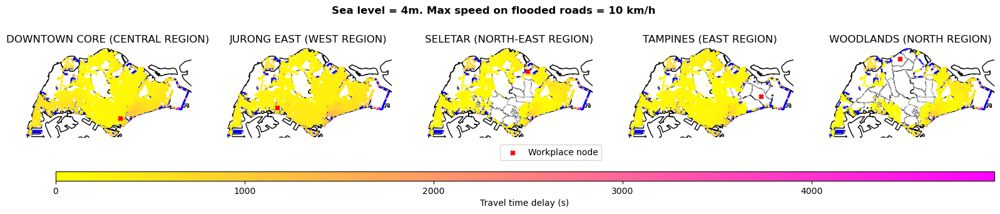

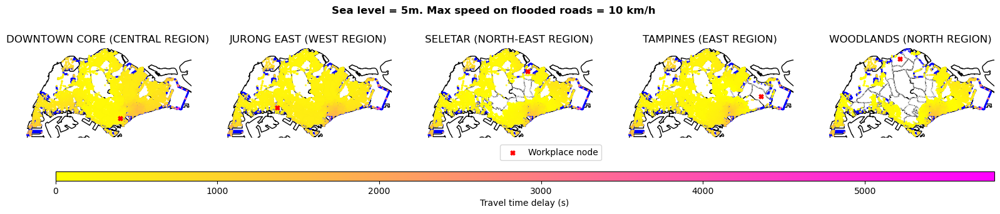

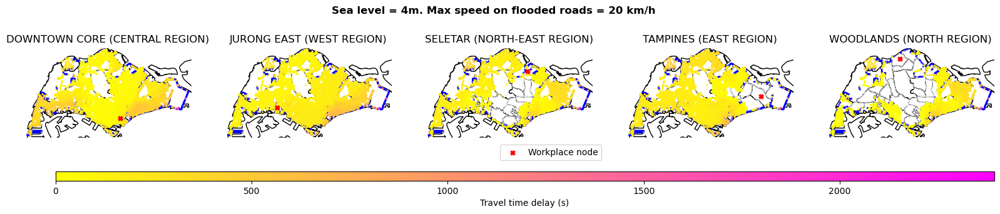

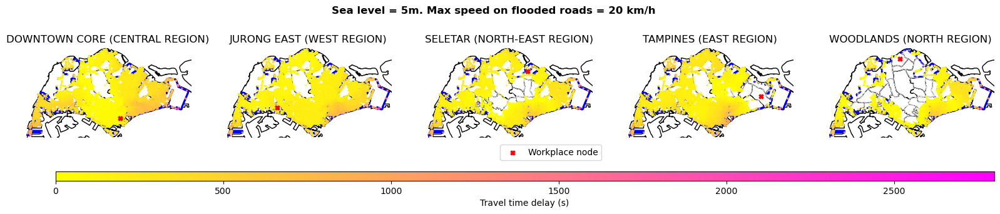

In [13]:
# parameter inputs
save_dir = r"data\coastalFloodRouting"

# filter planning areas to plot
selected_planningArea=['TAMPINES','JURONG EAST','WOODLANDS','DOWNTOWN CORE','SELETAR']
# speed params
percentage_reduction_maxspeed = None #50 # %
for flooded_maxspeed in [5,10,20]:

    for slr_type in ['SLR_4m','SLR_5m']:
        UFN = floodedRouting.UpdateFloodNetwork(G_car, flooded_maxspeed=flooded_maxspeed,
                                            percentage_reduction_maxspeed=percentage_reduction_maxspeed)
        # load precomputed flooded edges from SLR scenarios
        flooded_edges_fp = os.path.join(r"data\coastalFloodRouting",f"flooded_edges_{slr_type}.pkl")
        flooded_edges = utils.load_pickle(flooded_edges_fp)

        # save fp for itinerary df, and title for plots
        if flooded_maxspeed is not None:
            filename0 = f"car_routing_slrType{slr_type}_maxspeed{flooded_maxspeed}.csv"
            title = f"Sea level = {slr_type.replace("SLR_","")}. Max speed on flooded roads = {flooded_maxspeed} km/h"
        if percentage_reduction_maxspeed is not None:
            filename0 = f"car_routing_slrType{slr_type}_percReducMaxspeed{percentage_reduction_maxspeed}.csv"
            title = f"Sea level = {slr_type.replace("SLR_","")}. Speed reduction = {percentage_reduction_maxspeed}%"

        save_fp = os.path.join(save_dir,filename0)
        # itinerary df is derived from identifying flooded roads from historically flooded roads, and update travel speed and time in G
        itinerary_df = UFN.get_flooded_car_df(workplace_cluster,planningArea_shp,flooded_edges,
                                            save_fp=save_fp, cost="travel_time")

        # import data and read data
        # flooded itinerary
        car_flooded_df = pd.read_csv(save_fp)
        # non flooded itinerary
        car_dry_df = pd.read_csv(os.path.join(os.getcwd(),"data","car_routing_osmnx_planningArea.csv"))

        TTD = floodedRouting.TravelTimeDelay(car_flooded_df,car_dry_df,planningArea_shp,
                                            column_value="simulated_total_duration",
                                            end_groupby="end_PLN_AREA_N",
                                            start_groupby="start_REGION_N")

        # compute travel time delay by comparing the difference in dry_df and flooded_df
        travel_time_delay_df = TTD.compute_travel_time_delay()
        # group itinerary based on end_PLN_AREA_N
        itinerary_df_list = TTD.get_grouped_travel_time_delay(travel_time_delay_df)
        # filter grouped itinerary based on selected planning areas
        selected_itinerary = {k:df for k,df in itinerary_df_list.items() 
                            if k in selected_planningArea}
        # get stats
        filename = filename0.replace("routing","stats")
        save_fp = os.path.join(save_dir,filename)
        travelTimeDelay_stats_df = TTD.get_stats_travel_time_delay(travel_time_delay_df, save_fp=save_fp)

        # plot isochrone
        filename = filename0.replace("routing","isochrone_timeDelay").replace(".csv",".png")
        save_fp = os.path.join(save_dir,filename)
        ISO = dryRouting.PlotIsochrone(G_car,travel_time_delay_df,planningArea_shp)
        ISO.plot_isochrone(selected_itinerary,flooded_edges=flooded_edges,
                            column_value="travel_time_delay",
                            cmap="spring_r",flooded_edge_color="blue",
                            colorbar_label="Travel time delay (s)", title=title,
                            save_fp=save_fp)

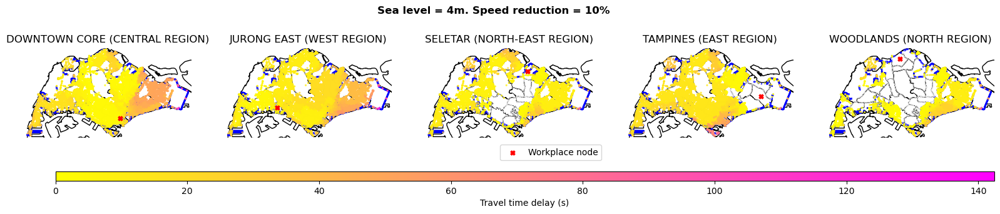

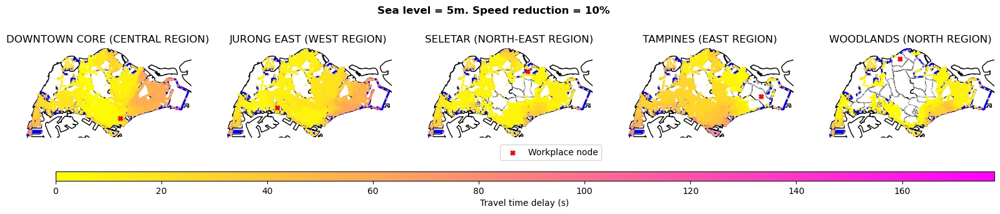

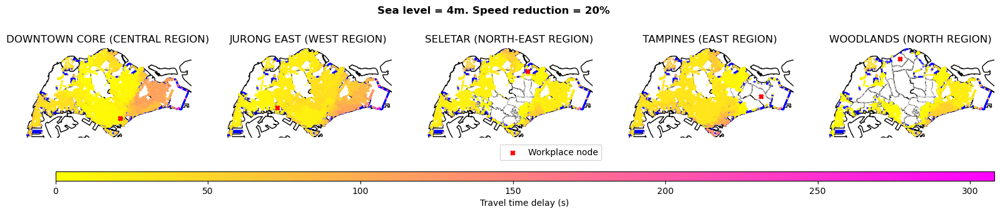

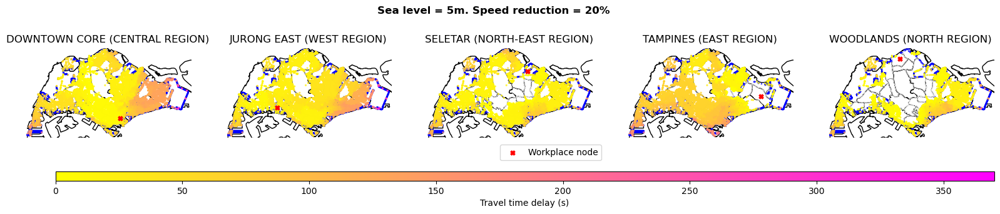

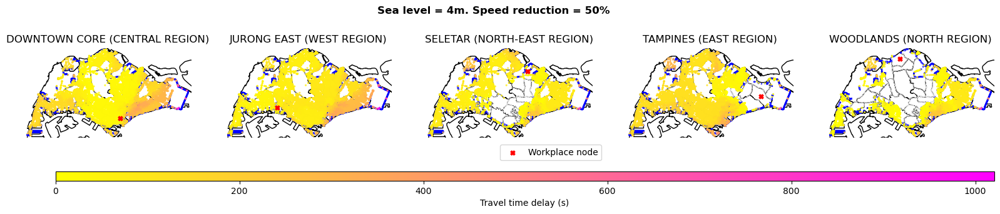

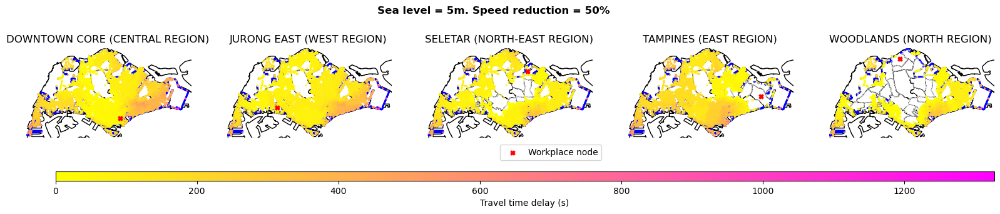

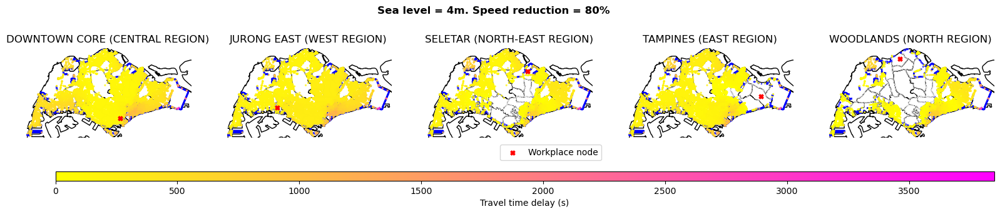

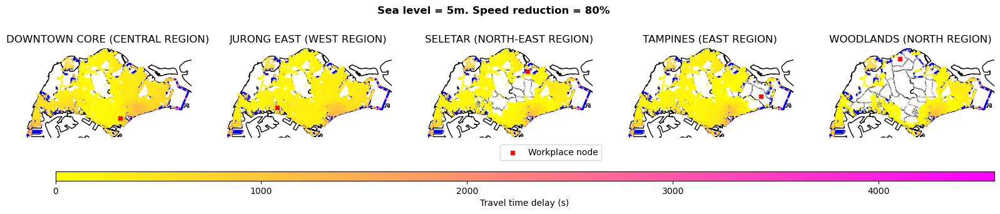

In [14]:
# parameter inputs
save_dir = r"data\coastalFloodRouting"

# filter planning areas to plot
selected_planningArea=['TAMPINES','JURONG EAST','WOODLANDS','DOWNTOWN CORE','SELETAR']
# speed params
flooded_maxspeed = None # km/h
for percentage_reduction_maxspeed in [10,20,50,80]:
    for slr_type in ['SLR_4m','SLR_5m']:
        UFN = floodedRouting.UpdateFloodNetwork(G_car, flooded_maxspeed=flooded_maxspeed,
                                            percentage_reduction_maxspeed=percentage_reduction_maxspeed)
        # load precomputed flooded edges from SLR scenarios
        flooded_edges_fp = os.path.join(r"data\coastalFloodRouting",f"flooded_edges_{slr_type}.pkl")
        flooded_edges = utils.load_pickle(flooded_edges_fp)

        # save fp for itinerary df, and title for plots
        if flooded_maxspeed is not None:
            filename0 = f"car_routing_slrType{slr_type}_maxspeed{flooded_maxspeed}.csv"
            title = f"Sea level = {slr_type.replace("SLR_","")}. Max speed on flooded roads = {flooded_maxspeed} km/h"
        if percentage_reduction_maxspeed is not None:
            filename0 = f"car_routing_slrType{slr_type}_percReducMaxspeed{percentage_reduction_maxspeed}.csv"
            title = f"Sea level = {slr_type.replace("SLR_","")}. Speed reduction = {percentage_reduction_maxspeed}%"

        save_fp = os.path.join(save_dir,filename0)
        # itinerary df is derived from identifying flooded roads from historically flooded roads, and update travel speed and time in G
        itinerary_df = UFN.get_flooded_car_df(workplace_cluster,planningArea_shp,flooded_edges,
                                            save_fp=save_fp, cost="travel_time")

        # import data and read data
        # flooded itinerary
        car_flooded_df = pd.read_csv(save_fp)
        # non flooded itinerary
        car_dry_df = pd.read_csv(os.path.join(os.getcwd(),"data","car_routing_osmnx_planningArea.csv"))

        TTD = floodedRouting.TravelTimeDelay(car_flooded_df,car_dry_df,planningArea_shp,
                                            column_value="simulated_total_duration",
                                            end_groupby="end_PLN_AREA_N",
                                            start_groupby="start_REGION_N")

        # compute travel time delay by comparing the difference in dry_df and flooded_df
        travel_time_delay_df = TTD.compute_travel_time_delay()
        # group itinerary based on end_PLN_AREA_N
        itinerary_df_list = TTD.get_grouped_travel_time_delay(travel_time_delay_df)
        # filter grouped itinerary based on selected planning areas
        selected_itinerary = {k:df for k,df in itinerary_df_list.items() 
                            if k in selected_planningArea}
        # get stats
        filename = filename0.replace("routing","stats")
        save_fp = os.path.join(save_dir,filename)
        travelTimeDelay_stats_df = TTD.get_stats_travel_time_delay(travel_time_delay_df, save_fp=save_fp)

        # plot isochrone
        filename = filename0.replace("routing","isochrone_timeDelay").replace(".csv",".png")
        save_fp = os.path.join(save_dir,filename)
        ISO = dryRouting.PlotIsochrone(G_car,travel_time_delay_df,planningArea_shp)
        ISO.plot_isochrone(selected_itinerary,flooded_edges=flooded_edges,
                            column_value="travel_time_delay",
                            cmap="spring_r",flooded_edge_color="blue",
                            colorbar_label="Travel time delay (s)", title=title,
                            save_fp=save_fp)

# Compound flooding

- pluvial and coastal flood

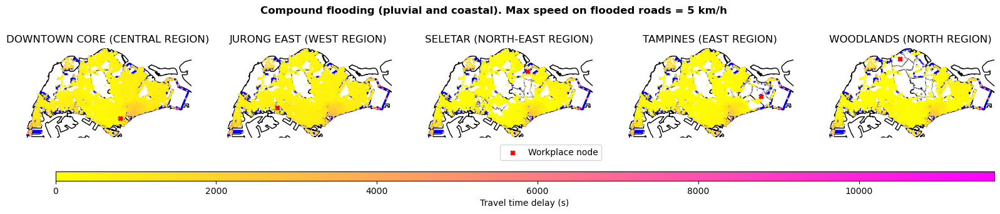

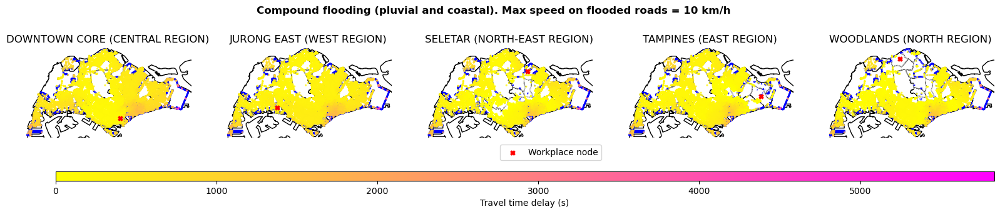

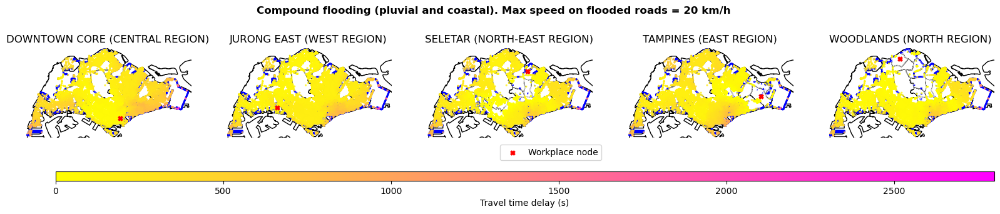

In [18]:
# parameter inputs
save_dir = r"data\compoundFloodRouting"
# rainfall params
rf_type = 'highest 60 min rainfall (mm)' # max 1 hour rainfall intensity
rf_perc = 99.9
rf_map = {perc:rf_val for perc, rf_val in zip(percentiles,list(historical_ppt_percentiles[rf_type]))}
rf_value = rf_map[rf_perc]
# slr params
slr_type = 'SLR_5m'
# filter planning areas to plot
selected_planningArea=['TAMPINES','JURONG EAST','WOODLANDS','DOWNTOWN CORE','SELETAR']
# speed params
percentage_reduction_maxspeed = None #50 # %
for flooded_maxspeed in [5,10,20]:
    # get flooded edges
    UFN = floodedRouting.UpdateFloodNetwork(G_car, flooded_maxspeed=flooded_maxspeed,
                                            percentage_reduction_maxspeed=percentage_reduction_maxspeed)
    # show flooded edges from pluvial flooding
    pluvial_flooded_edges = UFN.identify_flooded_roads(historical_floods,rf_value,rf_type=rf_type,plot=False,
                                            flooded_edge_color="red",edge_color="#999999")
    # flooded edges from coastal flooding
    flooded_edges_fp = os.path.join(r"data\coastalFloodRouting",f"flooded_edges_{slr_type}.pkl")
    coastal_flooded_edges = utils.load_pickle(flooded_edges_fp)
    # concat flooded edges, remove duplicated flooded edges
    flooded_edges = list(set(pluvial_flooded_edges + coastal_flooded_edges))
    
    # save fp for itinerary df, and title for plots
    if flooded_maxspeed is not None:
        filename0 = f"car_routing_compoundFlood_maxspeed{flooded_maxspeed}.csv"
        title = f"Compound flooding (pluvial and coastal). Max speed on flooded roads = {flooded_maxspeed} km/h"
    if percentage_reduction_maxspeed is not None:
        filename0 = f"car_routing_compoundFlood_percReducMaxspeed{percentage_reduction_maxspeed}.csv"
        title = f"Compound flooding (pluvial and coastal). Speed reduction = {percentage_reduction_maxspeed}%"

    save_fp = os.path.join(save_dir,filename0)
    # itinerary df is derived from identifying flooded roads from historically flooded roads, and update travel speed and time in G
    itinerary_df = UFN.get_flooded_car_df(workplace_cluster,planningArea_shp,flooded_edges,
                                            save_fp=save_fp, cost="travel_time")

    # import data and read data
    # flooded itinerary
    car_flooded_df = pd.read_csv(save_fp)
    # non flooded itinerary
    car_dry_df = pd.read_csv(os.path.join(os.getcwd(),"data","car_routing_osmnx_planningArea.csv"))

    TTD = floodedRouting.TravelTimeDelay(car_flooded_df,car_dry_df,planningArea_shp,
                                        column_value="simulated_total_duration",
                                        end_groupby="end_PLN_AREA_N",
                                        start_groupby="start_REGION_N")

    # compute travel time delay by comparing the difference in dry_df and flooded_df
    travel_time_delay_df = TTD.compute_travel_time_delay()
    # group itinerary based on end_PLN_AREA_N
    itinerary_df_list = TTD.get_grouped_travel_time_delay(travel_time_delay_df)
    # filter grouped itinerary based on selected planning areas
    selected_itinerary = {k:df for k,df in itinerary_df_list.items() 
                        if k in selected_planningArea}
    # get stats
    filename = filename0.replace("routing","stats")
    save_fp = os.path.join(save_dir,filename)
    travelTimeDelay_stats_df = TTD.get_stats_travel_time_delay(travel_time_delay_df, save_fp=save_fp)

    # plot isochrone
    filename = filename0.replace("routing","isochrone_timeDelay").replace(".csv",".png")
    save_fp = os.path.join(save_dir,filename)
    ISO = dryRouting.PlotIsochrone(G_car,travel_time_delay_df,planningArea_shp)
    ISO.plot_isochrone(selected_itinerary,flooded_edges=flooded_edges,
                        column_value="travel_time_delay",
                        cmap="spring_r",flooded_edge_color="blue",
                        colorbar_label="Travel time delay (s)", title=title,
                        save_fp=save_fp)

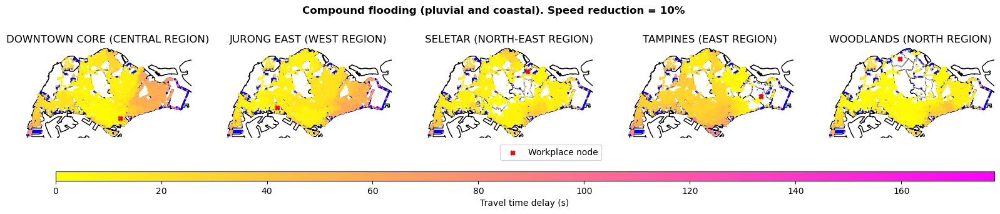

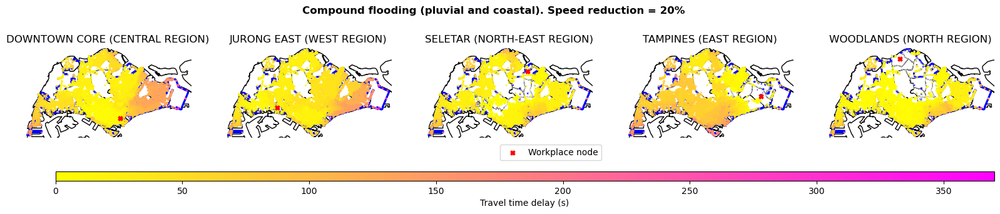

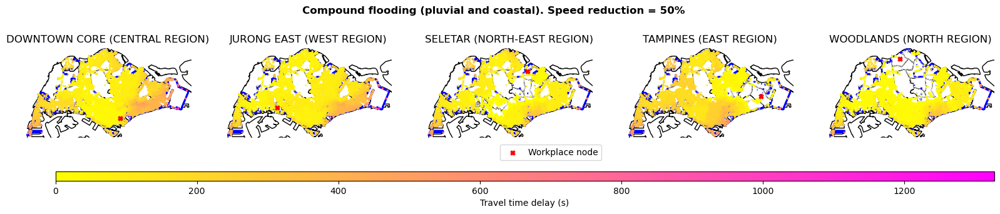

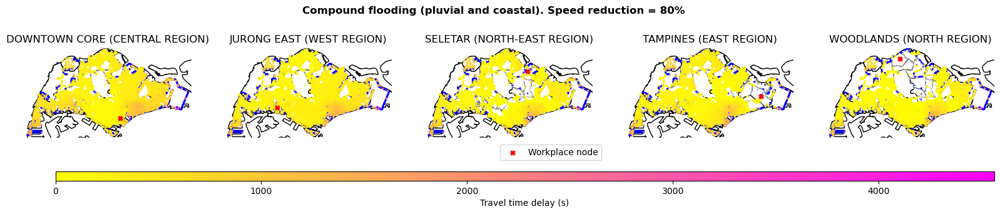

In [19]:
# parameter inputs
save_dir = r"data\compoundFloodRouting"
# rainfall params
rf_type = 'highest 60 min rainfall (mm)' # max 1 hour rainfall intensity
rf_perc = 99.9
rf_map = {perc:rf_val for perc, rf_val in zip(percentiles,list(historical_ppt_percentiles[rf_type]))}
rf_value = rf_map[rf_perc]
# slr params
slr_type = 'SLR_5m'
# filter planning areas to plot
selected_planningArea=['TAMPINES','JURONG EAST','WOODLANDS','DOWNTOWN CORE','SELETAR']
# speed params
flooded_maxspeed = None # km/h
for percentage_reduction_maxspeed in [10,20,50,80]:
    # get flooded edges
    UFN = floodedRouting.UpdateFloodNetwork(G_car, flooded_maxspeed=flooded_maxspeed,
                                            percentage_reduction_maxspeed=percentage_reduction_maxspeed)
    # show flooded edges from pluvial flooding
    pluvial_flooded_edges = UFN.identify_flooded_roads(historical_floods,rf_value,rf_type=rf_type,plot=False,
                                            flooded_edge_color="red",edge_color="#999999")
    # flooded edges from coastal flooding
    flooded_edges_fp = os.path.join(r"data\coastalFloodRouting",f"flooded_edges_{slr_type}.pkl")
    coastal_flooded_edges = utils.load_pickle(flooded_edges_fp)
    # concat flooded edges, remove duplicated flooded edges
    flooded_edges = list(set(pluvial_flooded_edges + coastal_flooded_edges))
    
    # save fp for itinerary df, and title for plots
    if flooded_maxspeed is not None:
        filename0 = f"car_routing_compoundFlood_maxspeed{flooded_maxspeed}.csv"
        title = f"Compound flooding (pluvial and coastal). Max speed on flooded roads = {flooded_maxspeed} km/h"
    if percentage_reduction_maxspeed is not None:
        filename0 = f"car_routing_compoundFlood_percReducMaxspeed{percentage_reduction_maxspeed}.csv"
        title = f"Compound flooding (pluvial and coastal). Speed reduction = {percentage_reduction_maxspeed}%"

    save_fp = os.path.join(save_dir,filename0)
    # itinerary df is derived from identifying flooded roads from historically flooded roads, and update travel speed and time in G
    itinerary_df = UFN.get_flooded_car_df(workplace_cluster,planningArea_shp,flooded_edges,
                                            save_fp=save_fp, cost="travel_time")

    # import data and read data
    # flooded itinerary
    car_flooded_df = pd.read_csv(save_fp)
    # non flooded itinerary
    car_dry_df = pd.read_csv(os.path.join(os.getcwd(),"data","car_routing_osmnx_planningArea.csv"))

    TTD = floodedRouting.TravelTimeDelay(car_flooded_df,car_dry_df,planningArea_shp,
                                        column_value="simulated_total_duration",
                                        end_groupby="end_PLN_AREA_N",
                                        start_groupby="start_REGION_N")

    # compute travel time delay by comparing the difference in dry_df and flooded_df
    travel_time_delay_df = TTD.compute_travel_time_delay()
    # group itinerary based on end_PLN_AREA_N
    itinerary_df_list = TTD.get_grouped_travel_time_delay(travel_time_delay_df)
    # filter grouped itinerary based on selected planning areas
    selected_itinerary = {k:df for k,df in itinerary_df_list.items() 
                        if k in selected_planningArea}
    # get stats
    filename = filename0.replace("routing","stats")
    save_fp = os.path.join(save_dir,filename)
    travelTimeDelay_stats_df = TTD.get_stats_travel_time_delay(travel_time_delay_df, save_fp=save_fp)

    # plot isochrone
    filename = filename0.replace("routing","isochrone_timeDelay").replace(".csv",".png")
    save_fp = os.path.join(save_dir,filename)
    ISO = dryRouting.PlotIsochrone(G_car,travel_time_delay_df,planningArea_shp)
    ISO.plot_isochrone(selected_itinerary,flooded_edges=flooded_edges,
                        column_value="travel_time_delay",
                        cmap="spring_r",flooded_edge_color="blue",
                        colorbar_label="Travel time delay (s)", title=title,
                        save_fp=save_fp)

### Calculate total travel time delay
$\sum t_{car, D} = N_{car, D} \times p_{O,D} \times \bar{t}$ 
- total travel time delay is number of cars, multiplied by proportion of routes affected travelling from O to D, and multiplying by travel time delay stats

In [83]:
maxTrafficVol = pd.read_csv(r"data\SpatialTravelPatterns_maxTrafficVol_planningArea.csv")
print("Length of maxTrafficVol: ", len(maxTrafficVol))
maxTrafficVol.head()
travelTimeDelay_stats_df = pd.read_csv(r"data\coastalFloodRouting\car_stats_slrTypeSLR_4m_maxspeed5.csv")
print(travelTimeDelay_stats_df.columns)
travelTimeDelay_stats_df.head()

def get_potential_time_delay(trafficVol,travelTimeDelay_stats_df):
    """   
    Args:
        trafficVol (pd.DataFrame): traffic volume from region to planning area
        travelTimeDelay_stats_df (pd.DataFrame): travel time delay statistics from region to planning area
    """
    columns_select = [i for i in trafficVol.columns if bool(re.search("^max_traffic.*REGION$",i))]
    # rename columns
    trafficVol_long = trafficVol[['PLN_AREA_N']+columns_select].rename(columns = lambda x: x.replace("max_traffic_",""))
    # cast table from wide to long
    trafficVol_long = pd.melt(trafficVol_long,id_vars=['PLN_AREA_N'],var_name="REGION_N", value_name="max_traffic_vol")
    # merge traffic vol df with travel time delay stats df
    trafficVol_stats = pd.merge(left=trafficVol_long,right=travelTimeDelay_stats_df,
                                how="inner",left_on=['PLN_AREA_N','REGION_N'], right_on=['end_PLN_AREA_N','start_REGION_N'])
    
    stats_col = ['mean_delay','min_delay', '25%_delay', '50%_delay', '75%_delay','max_delay']
    for col in stats_col:
        prop_routes_affected = trafficVol_stats['count']/trafficVol_stats['count_delay']
        # num of cars affected
        max_traffic_vol = trafficVol_stats['max_traffic_vol']
        trafficVol_stats[f"potential_total_{col}"] = max_traffic_vol*prop_routes_affected*trafficVol_stats[col]

    return trafficVol_stats

potential_time_delay = get_potential_time_delay(maxTrafficVol,travelTimeDelay_stats_df)
print(potential_time_delay.columns)
potential_time_delay.head()

Length of maxTrafficVol:  42
Index(['end_PLN_AREA_N', 'start_REGION_N', 'count', 'mean', 'std', 'min',
       '25%', '50%', '75%', 'max', 'sum', 'count_delay', 'mean_delay',
       'std_delay', 'min_delay', '25%_delay', '50%_delay', '75%_delay',
       'max_delay', 'whislow_delay', 'whishigh_delay'],
      dtype='object')
Index(['PLN_AREA_N', 'REGION_N', 'max_traffic_vol', 'end_PLN_AREA_N',
       'start_REGION_N', 'count', 'mean', 'std', 'min', '25%', '50%', '75%',
       'max', 'sum', 'count_delay', 'mean_delay', 'std_delay', 'min_delay',
       '25%_delay', '50%_delay', '75%_delay', 'max_delay', 'whislow_delay',
       'whishigh_delay', 'potential_total_mean_delay',
       'potential_total_min_delay', 'potential_total_25%_delay',
       'potential_total_50%_delay', 'potential_total_75%_delay',
       'potential_total_max_delay'],
      dtype='object')


,PLN_AREA_N,REGION_N,max_traffic_vol,end_PLN_AREA_N,start_REGION_N,count,mean,std,min,25%,...,75%_delay,max_delay,whislow_delay,whishigh_delay,potential_total_mean_delay,potential_total_min_delay,potential_total_25%_delay,potential_total_50%_delay,potential_total_75%_delay,potential_total_max_delay
0,ANG MO KIO,CENTRAL REGION,1513.577953,ANG MO KIO,CENTRAL REGION,8550.0,146.218717,356.338044,0.000000,0.000000,...,810.792107,3429.060180,-952.398033,1868.706190,3.055672e+06,756.007165,593434.536534,2.163406e+06,4.559989e+06,1.928543e+07
1,BEDOK,CENTRAL REGION,1103.088569,BEDOK,CENTRAL REGION,8550.0,319.652049,337.819882,0.000000,168.611250,...,313.809455,3296.940306,-38.067094,524.935385,3.590424e+05,10375.533747,192634.056454,2.389331e+05,3.493054e+05,3.669867e+06
2,BISHAN,CENTRAL REGION,244.972174,BISHAN,CENTRAL REGION,8550.0,145.019886,351.940397,0.000000,0.000000,...,754.762653,3396.172379,-905.890545,1751.154572,4.270615e+05,99.428739,76867.891842,2.907868e+05,6.410622e+05,2.884560e+06
3,BOON LAY,CENTRAL REGION,916.611574,BOON LAY,CENTRAL REGION,8550.0,388.970487,430.837148,51.427553,58.210335,...,538.926712,3730.828252,-662.864230,1260.001277,3.565349e+05,47139.090286,53356.267080,2.596436e+05,4.939865e+05,3.419720e+06
4,BUKIT BATOK,CENTRAL REGION,979.739424,BUKIT BATOK,CENTRAL REGION,8550.0,206.898793,384.638196,0.000000,0.000000,...,499.045662,3594.675823,-488.042790,1091.298733,6.862074e+05,199.075015,187851.468574,3.478377e+05,8.995894e+05,6.479832e+06


{'CENTRAL REGION': {'ANG MO KIO': 2163406.113494205,
  'BEDOK': 238933.05739335634,
  'BISHAN': 290786.78434155014,
  'BOON LAY': 259643.61074399285,
  'BUKIT BATOK': 347837.66355325124,
  'BUKIT MERAH': 4733454.178642762,
  'BUKIT PANJANG': 326414.8737772113,
  'BUKIT TIMAH': 3619188.887070995,
  'CENTRAL WATER CATCHMENT': 0,
  'CHANGI': 235647.85902065362,
  'CHANGI BAY': 0,
  'CHOA CHU KANG': 298330.1098312822,
  'CLEMENTI': 401944.74167324405,
  'DOWNTOWN CORE': 833264.2049115516,
  'GEYLANG': 1011229.728659932,
  'HOUGANG': 112655.97792974765,
  'JURONG EAST': 922689.9572541079,
  'JURONG WEST': 181743.96364863927,
  'KALLANG': 485532.10690780886,
  'LIM CHU KANG': 0,
  'MANDAI': 0,
  'MARINA EAST': 0,
  'MARINA SOUTH': 0,
  'MARINE PARADE': 607742.7409423806,
  'MUSEUM': 138416.6732611686,
  'NEWTON': 3792863.9106136044,
  'NOVENA': 4936242.994461831,
  'ORCHARD': 762011.1676577696,
  'OUTRAM': 110318.12471718116,
  'PASIR RIS': 143833.14769134816,
  'PAYA LEBAR': 86726.756074578

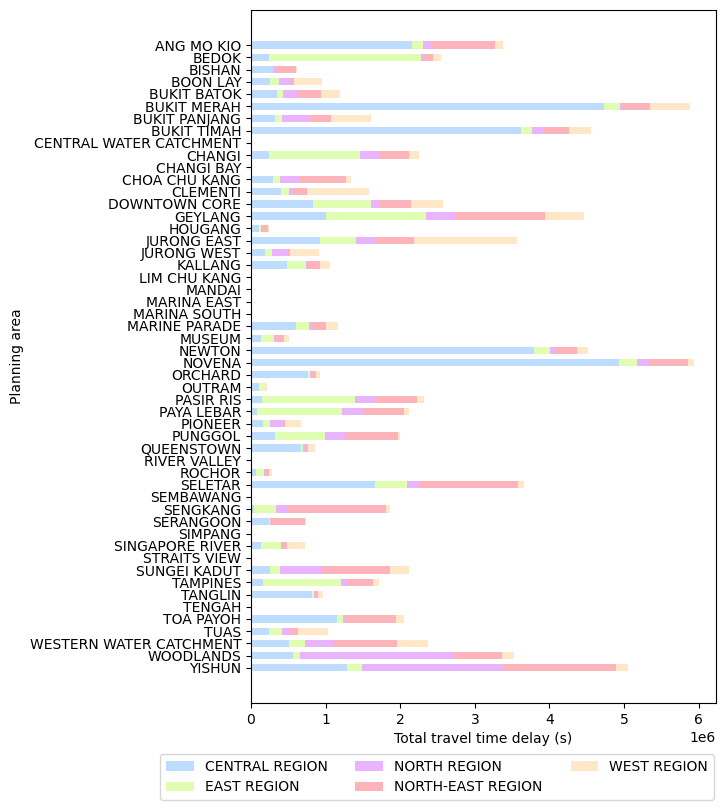

In [84]:
TTD.plot_total_travel_time_delay(potential_time_delay,stats_param='potential_total_50%_delay',
                                                       selected_planningArea=None)

# Impute traffic flow for roads with unknown traffic volume

In [38]:
# percentage_reduction_maxspeed = None
# flooded_maxspeed = 5
# slr_type = 'SLR_5m'
# save_dir = r"data\floodRouting"
# filename0 = "car_routing_rfTypehighest 60 min rainfall (mm)_rfPerc99.9_maxspeed5.csv"
# save_fp = os.path.join(save_dir,filename0)
# car_flooded_df = pd.read_csv(save_fp)
# # non flooded itinerary
# car_dry_df = pd.read_csv(os.path.join(os.getcwd(),"data","car_routing_osmnx_planningArea.csv"))

# TTD = floodedRouting.TravelTimeDelay(car_flooded_df,car_dry_df,planningArea_shp,
#                                     column_value="simulated_total_duration",
#                                     end_groupby="end_PLN_AREA_N",
#                                     start_groupby="start_REGION_N")
# # compute travel time delay by comparing the difference in dry_df and flooded_df
# travel_time_delay_df = TTD.compute_travel_time_delay()
# travel_time_delay_df.head()


# # load precomputed flooded edges from SLR scenarios
# flooded_edges_fp = os.path.join(r"data\coastalFloodRouting",f"flooded_edges_{slr_type}.pkl")
# flooded_edges = utils.load_pickle(flooded_edges_fp)
# UFN = floodedRouting.UpdateFloodNetwork(G_car, flooded_maxspeed=flooded_maxspeed,
#                                                 percentage_reduction_maxspeed=percentage_reduction_maxspeed)
# G_copy = UFN.update_flooded_road_network(flooded_edges,plot=False)
# def impute_traffic_vol_routes(G_flooded,travel_time_delay_df,flooded_edges,cost="travel_time"):
#     """  
#     Args:
#         G_flooded (MultiDiGraph): graph of drive network with travel_time updated based on affected flooded routes
#         travel_time_delay_df (pd.DataFrame): df that describes the travel time delay
#     """
#     # returns a n array of tuple (start_nodesID, end_nodesID) of nodes with routes affected by flood
#     start_end_affected_nodes = travel_time_delay_df[travel_time_delay_df['travel_time_delay']>0].index.values
#     print("Number of routes affected: ", start_end_affected_nodes.shape)
#     print(f"start {start_end_affected_nodes[0][0]} and end node {start_end_affected_nodes[0][1]} of a route")
#     # for (start_node, end_node) in start_end_affected_nodes:
#     #     nx.shortest_path(start_node,end_node,weight=cost)
#     list_routes = ox.shortest_path(G_flooded, 
#                                    orig = [start_end_affected_nodes[i][0] for i in range(start_end_affected_nodes.shape[0])],
#                                    dest = [start_end_affected_nodes[i][1] for i in range(start_end_affected_nodes.shape[0])],
#                                    weight = cost)
#     print("Number of routes affected: ", len(list_routes))
#     print(f"start {list_routes[0][0]} and end node {list_routes[0][-1]} of a route")
#     # convert the flooded_edges into a set
#     flooded_edges_set = set([(e[0],e[1]) for e in flooded_edges])
#     routes_affected = []
#     for i in range(start_end_affected_nodes.shape[0]):
#         route = list_routes[i]
#         # convert route to a set of edges
#         path_edges = set(zip(route[:-1], route[1:]))
#         r = {'start_nodesID': start_end_affected_nodes[i][0],
#              'end_nodesID': start_end_affected_nodes[i][1],
#              'affected_route': route,
#              'flooded_edges': path_edges & flooded_edges_set
#              }
#         routes_affected.append(r)

#     return routes_affected

    
# routes_affected = impute_traffic_vol_routes(G_copy,travel_time_delay_df,flooded_edges)

Number of routes affected:  (357400,)
start 243423319 and end node 310582393 of a route


KeyboardInterrupt: 

#### Import travelTimeDelay_stats_df

In [ ]:
# save_dir = r"data\floodRouting"
# filename0 = "car_routing_rfTypehighest 60 min rainfall (mm)_rfPerc99.9_maxspeed5.csv"
# save_fp = os.path.join(save_dir,filename0)
# car_flooded_df = pd.read_csv(save_fp)
# # non flooded itinerary
# car_dry_df = pd.read_csv(os.path.join(os.getcwd(),"data","car_routing_osmnx_planningArea.csv"))

# TTD = floodedRouting.TravelTimeDelay(car_flooded_df,car_dry_df,planningArea_shp,
#                                     column_value="simulated_total_duration",
#                                     end_groupby="end_PLN_AREA_N",
#                                     start_groupby="start_REGION_N")
# # compute travel time delay by comparing the difference in dry_df and flooded_df
# travel_time_delay_df = TTD.compute_travel_time_delay()
# travel_time_delay_df.head()
# # travelTimeDelay_stats_df = pd.read_csv(os.path.join(save_dir,filename0.replace("routing","stats")))
# # travelTimeDelay_stats_df.head()
# travel_time_delay_df[travel_time_delay_df['travel_time_delay']>0]

,,simulated_total_duration_wet,end_lat,end_lon,start_lat,start_lon,start_PLN_AREA_N,start_PLN_AREA_C,start_REGION_N,start_REGION_C,start_merge,end_PLN_AREA_N,end_PLN_AREA_C,end_REGION_N,end_REGION_C,end_merge,simulated_total_duration_dry,travel_time_delay
start_nodesID,end_nodesID,,,,,,,,,,,,,,,,,
243423319,310582393,215.819470,1.353185,103.838386,1.353620,103.848345,BISHAN,BS,CENTRAL REGION,CR,both,BISHAN,BS,CENTRAL REGION,CR,both,211.249761,4.569709
243423221,310582393,216.683392,1.353185,103.838386,1.353585,103.848447,BISHAN,BS,CENTRAL REGION,CR,both,BISHAN,BS,CENTRAL REGION,CR,both,208.731841,7.951551
4593195691,310582393,217.495098,1.353185,103.838386,1.353701,103.848484,BISHAN,BS,CENTRAL REGION,CR,both,BISHAN,BS,CENTRAL REGION,CR,both,209.543547,7.951551
4591897641,310582393,217.609108,1.353185,103.838386,1.353263,103.848227,BISHAN,BS,CENTRAL REGION,CR,both,BISHAN,BS,CENTRAL REGION,CR,both,213.762237,3.846872
4593195692,310582393,218.371670,1.353185,103.838386,1.353739,103.848381,BISHAN,BS,CENTRAL REGION,CR,both,BISHAN,BS,CENTRAL REGION,CR,both,210.420119,7.951551
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4636793719,4492168243,1923.668956,1.382278,103.718277,1.344348,103.982322,CHANGI,CH,EAST REGION,ER,both,WESTERN WATER CATCHMENT,WC,WEST REGION,WR,both,1727.798009,195.870947
4746795703,4492168243,1924.747975,1.382278,103.718277,1.344313,103.982191,CHANGI,CH,EAST REGION,ER,both,WESTERN WATER CATCHMENT,WC,WEST REGION,WR,both,1728.877028,195.870947
4746795697,4492168243,1925.072327,1.382278,103.718277,1.343400,103.982506,CHANGI,CH,EAST REGION,ER,both,WESTERN WATER CATCHMENT,WC,WEST REGION,WR,both,1729.201380,195.870947


{'CENTRAL REGION': {'ANG MO KIO': 18124.057002886417,
  'BEDOK': 36840.040152295536,
  'BISHAN': 26734.475802184606,
  'BOON LAY': 17494.701707501736,
  'BUKIT BATOK': 16711.27055034442,
  'BUKIT MERAH': 18794.23083647119,
  'BUKIT PANJANG': 36583.95789940478,
  'BUKIT TIMAH': 33287.30711004978,
  'CENTRAL WATER CATCHMENT': 36006.194871230684,
  'CHANGI': 41077.0012578031,
  'CHANGI BAY': 0,
  'CHOA CHU KANG': 76501.14688628723,
  'CLEMENTI': 17471.910496456498,
  'DOWNTOWN CORE': 22644.169220624528,
  'GEYLANG': 32295.9944538153,
  'HOUGANG': 25427.672789612247,
  'JURONG EAST': 17501.5594174294,
  'JURONG WEST': 14215.21563210131,
  'KALLANG': 44883.84977035,
  'LIM CHU KANG': 259751.82911548056,
  'MANDAI': 8562.464143096331,
  'MARINA EAST': 58415.53876744872,
  'MARINA SOUTH': 76807.3877398182,
  'MARINE PARADE': 40184.73179721307,
  'MUSEUM': 35544.83941318389,
  'NEWTON': 67861.43842651442,
  'NOVENA': 60263.63826178542,
  'ORCHARD': 60971.12299076878,
  'OUTRAM': 25891.95965404

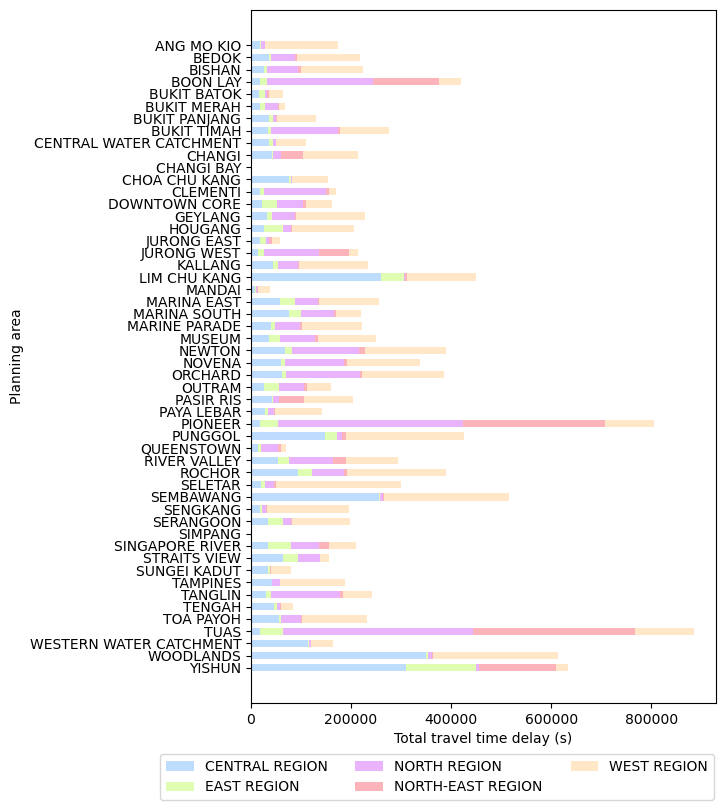

In [14]:
TTD.plot_total_travel_time_delay(travelTimeDelay_stats_df,stats_param='sum',
                                                       selected_planningArea=None)

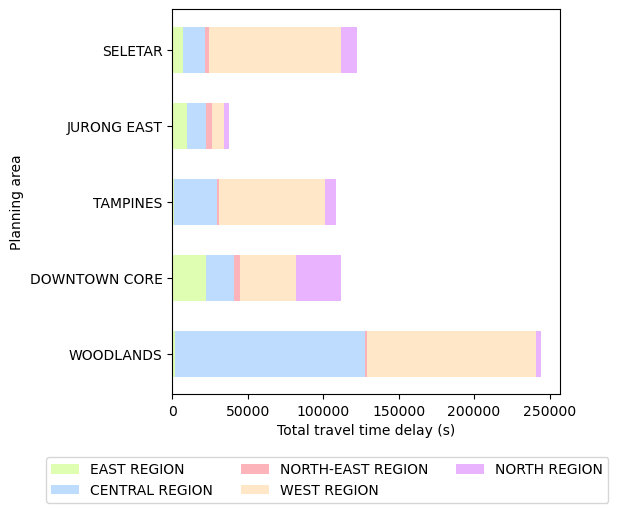

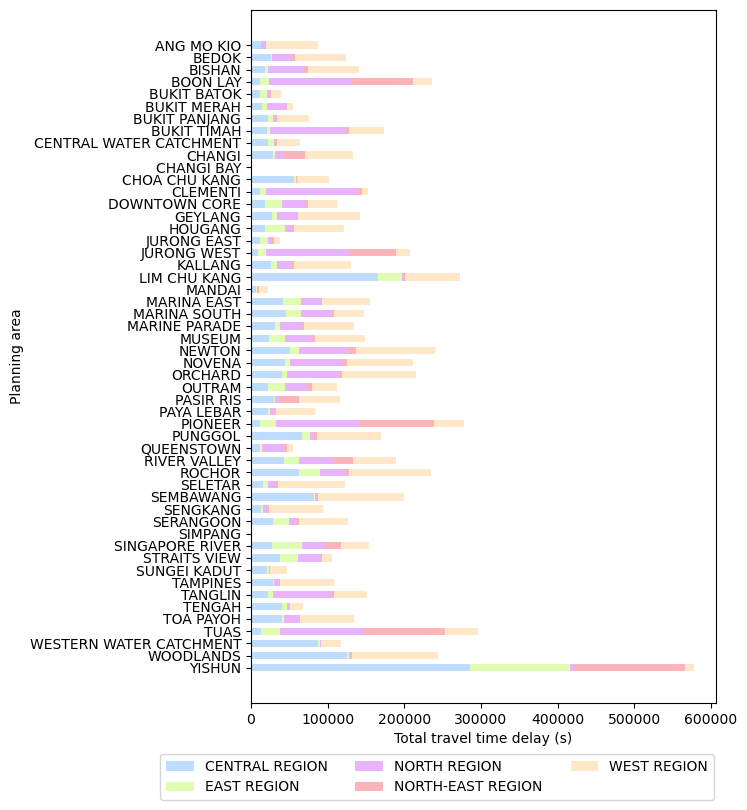

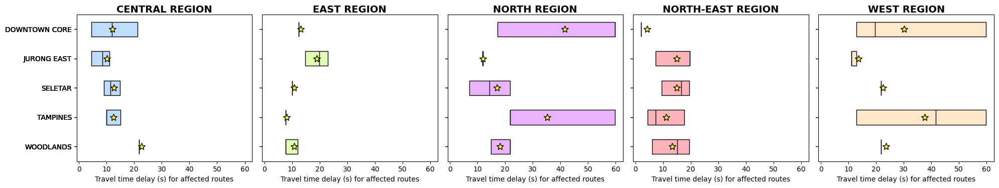

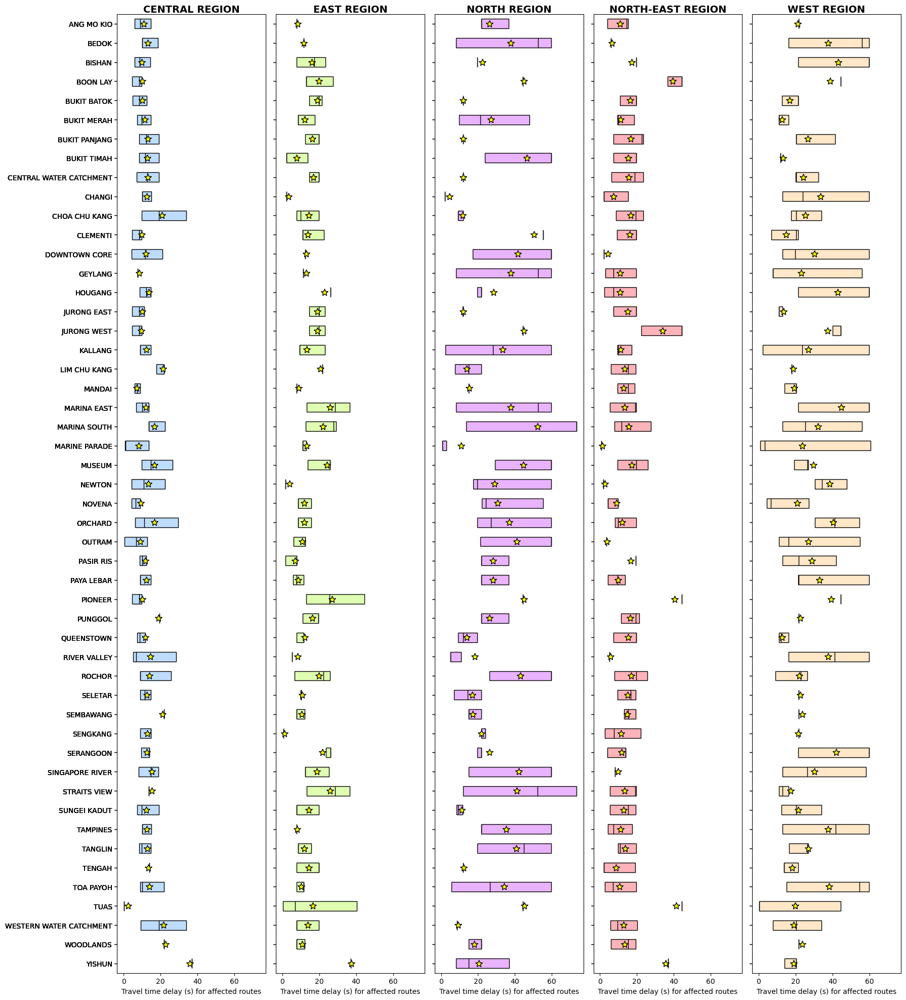

In [ ]:
# filter planning areas to plot
selected_planningArea=['TAMPINES','JURONG EAST','WOODLANDS','DOWNTOWN CORE','SELETAR']
# title from plot
if flooded_maxspeed is not None:
    title = f"{rf_value:.2f} ({rf_perc}th of {rf_type})\nMax speed on flooded roads = {flooded_maxspeed} km/h"
if percentage_reduction_maxspeed is not None:
    title = f"{rf_value:.2f} ({rf_perc}th of {rf_type})\nSpeed reduction = {percentage_reduction_maxspeed}%"
# plot total travel time delay by planning area as stacked bar chart
stacked_bar_results = TTD.plot_total_travel_time_delay(stats_param='sum',
                                                       selected_planningArea=selected_planningArea,
                                                       width=0.6,figsize=(5,5),bbox_to_anchor=(0.4,-0.3))

stacked_bar_results = TTD.plot_total_travel_time_delay(stats_param='sum',
                                                       selected_planningArea=None)
# plot travel time delay by planning area as boxplot
# plot boxplot for all planning areas

boxplot_results = TTD.plot_travel_time_delay_stats(selected_planningArea=selected_planningArea,
                                                   showwhiskers=False)

boxplot_results = TTD.plot_travel_time_delay_stats(selected_planningArea=None,
                                                   figsize=(18,20),
                                                   showwhiskers=False)

In [66]:
def update_travelTimeDelay_with_spatialTravelPatterns(travelTimeDelay_stats_df,spatialTravelPatterns,travel_mode):
    """ 
    recalculate travel time delay with actual travel patterns statistics
    Args:
        travelTimeDelay_districts_df (pd.DataFrame): dataframe that summarises the statistics of travel time delay by planning area and region.
        spatialTravelPatterns (pd.DataFrame): dataframe that shows that travel mode and volume from region to pln_area
        travel_mode (str): car or bus
    """
    travelTimeDelay_stats_df = travelTimeDelay_stats_df.merge(spatialTravelPatterns, on=['end_PLN_AREA_N','start_REGION_N'], how='left')
    travel_mode_column_name = [i for i in travelTimeDelay_stats_df.columns if travel_mode in i.lower()]
    assert len(travel_mode_column_name) > 0, "unable to find travel_mode name in the column names of spatialTravelPatterns df"
    travel_mode_column_name = travel_mode_column_name[0]

    return travelTimeDelay_stats_df, travel_mode_column_name

update_travelTimeDelay_with_spatialTravelPatterns(travelTimeDelay_stats_df,spatialTravelPatterns,travel_mode='car')

(    end_PLN_AREA_N     start_REGION_N   count       mean        std       min  \
 0       ANG MO KIO     CENTRAL REGION  8550.0   1.482446   4.470330   0.00000   
 1       ANG MO KIO        EAST REGION  3487.0   0.245566   1.596338   0.00000   
 2       ANG MO KIO       NORTH REGION  2515.0   2.113853   7.591990   0.00000   
 3       ANG MO KIO  NORTH-EAST REGION  4392.0   0.192715   1.632109   0.00000   
 4       ANG MO KIO        WEST REGION  4884.0  13.956911  10.685354   0.00000   
 ..             ...                ...     ...        ...        ...       ...   
 245         YISHUN     CENTRAL REGION  8550.0  33.459236  11.493319   0.00000   
 246         YISHUN        EAST REGION  3487.0  37.390129   1.993308  36.98924   
 247         YISHUN       NORTH REGION  2515.0   1.881866   7.126805   0.00000   
 248         YISHUN  NORTH-EAST REGION  4392.0  32.916076  11.606969   0.00000   
 249         YISHUN        WEST REGION  4884.0   2.497285   7.421235   0.00000   
 
           25%

In [71]:
spatialTravelPatterns.sort_values('Car/Taxi/Private Hire Car Only',ascending=False).head()

,end_PLN_AREA_N,start_REGION_N,Total,Combinations of MRT/LRT or Public Bus,Car/Taxi/Private Hire Car Only,Other Modes,No Transport Required
11,DOWNTOWN CORE,CENTRAL REGION,90786,63969.0,23265.0,1547.0,2005.0
152,DOWNTOWN CORE,NORTH-EAST REGION,64987,51430.0,11951.0,1524.0,83.0
58,DOWNTOWN CORE,EAST REGION,50621,37820.0,11170.0,1547.0,84.0
27,QUEENSTOWN,CENTRAL REGION,35551,21783.0,10641.0,1150.0,1977.0
153,GEYLANG,NORTH-EAST REGION,32371,19847.0,10179.0,2167.0,178.0


In [32]:
print("Length of df: ",len(travel_time_delay_df))
print("Number of unique end_nodesID: ",len(set(travel_time_delay_df.reset_index()['end_nodesID'])))
print("Number of unique planning area: ",len(set(travel_time_delay_df['end_PLN_AREA_N'])))
print("Number of unique regions: ",len(set(travel_time_delay_df['end_REGION_N'])))
# group travel time delay by planning area and region and calculate sum and mean of travel time delay
print(travelTimeDelay_stats_df.columns)

Length of df:  1191450
Number of unique end_nodesID:  50
Number of unique planning area:  50
Number of unique regions:  5
Index(['end_PLN_AREA_N', 'start_REGION_N', 'count', 'mean', 'std', 'min',
       '25%', '50%', '75%', 'max', 'sum', 'count_delay', 'mean_delay',
       'std_delay', 'min_delay', '25%_delay', '50%_delay', '75%_delay',
       'max_delay', 'whislow_delay', 'whishigh_delay'],
      dtype='object')


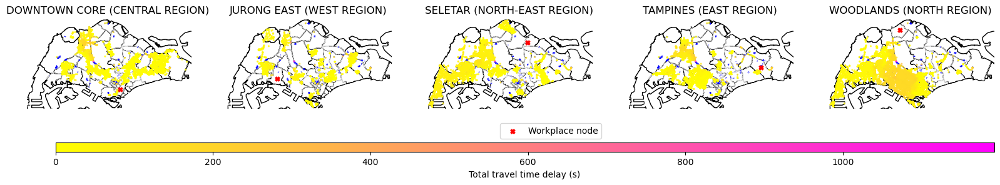

In [19]:
selected_planningArea=['TAMPINES','JURONG EAST','WOODLANDS','DOWNTOWN CORE','SELETAR']
itinerary_df_list = TTD.get_grouped_travel_time_delay(travel_time_delay_df)

selected_itinerary = {k:df for k,df in itinerary_df_list.items() 
                      if k in selected_planningArea}

# plot isochrone
ISO = dryRouting.PlotIsochrone(G_car,travel_time_delay_df,planningArea_shp)
ISO.plot_isochrone(selected_itinerary,flooded_edges=flooded_edges,
                   column_value="travel_time_delay",
                    cmap="spring_r",flooded_edge_color="blue",
                    colorbar_label="Total travel time delay (s)", title=None,
                    save_fp=None)

# Car wet weather isochrone

- Note that for cars: shortest time travel also includes rerouting, i.e. fastest travel route taken during dry weather may not be the same route for wet weather

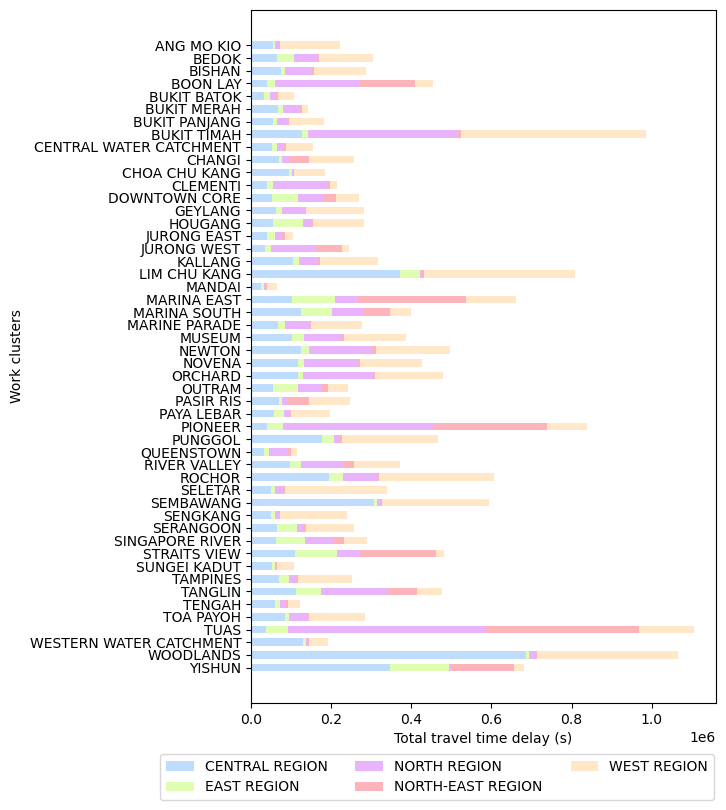

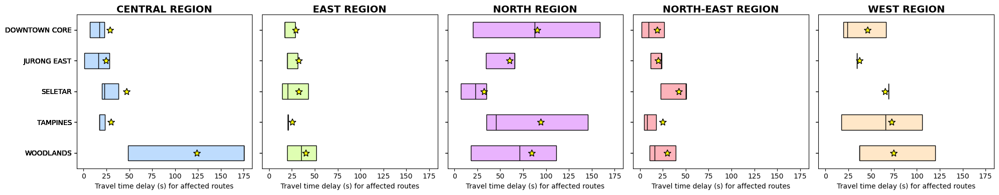

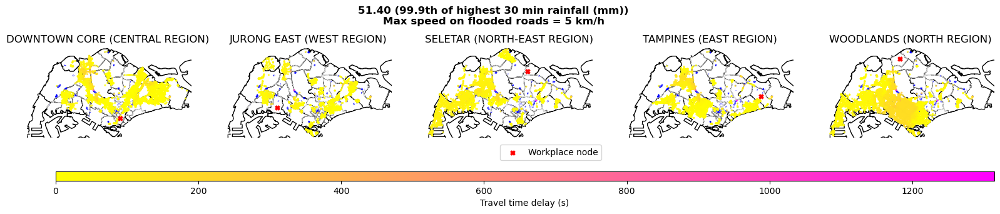

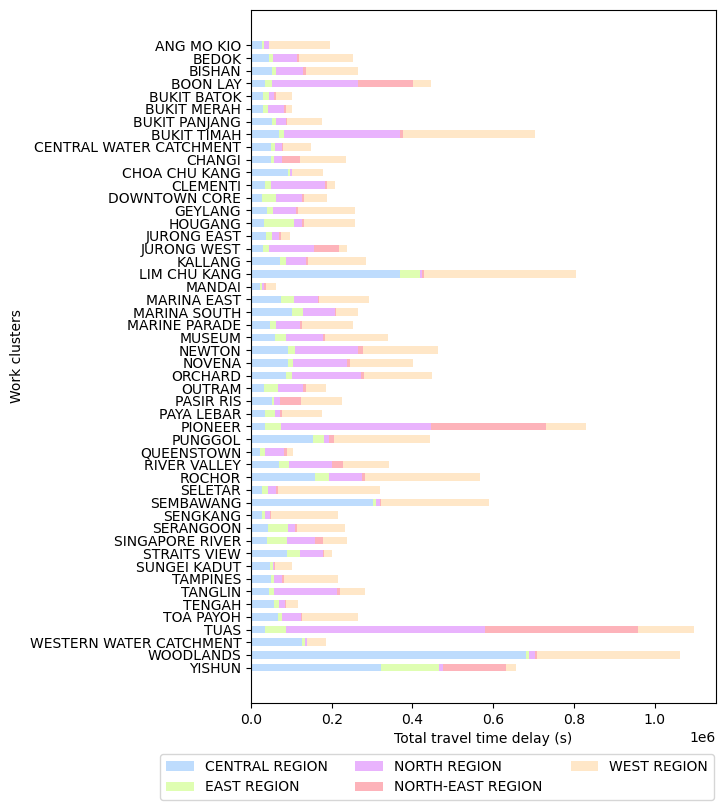

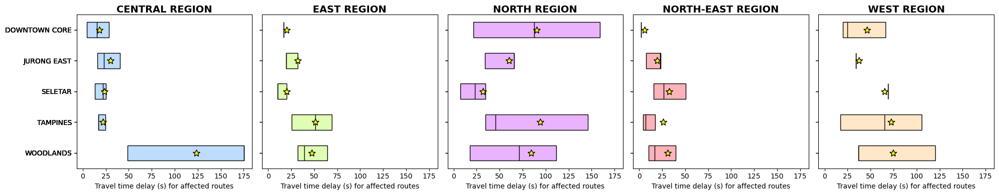

...

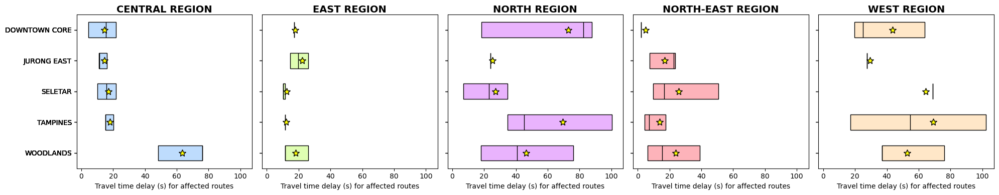

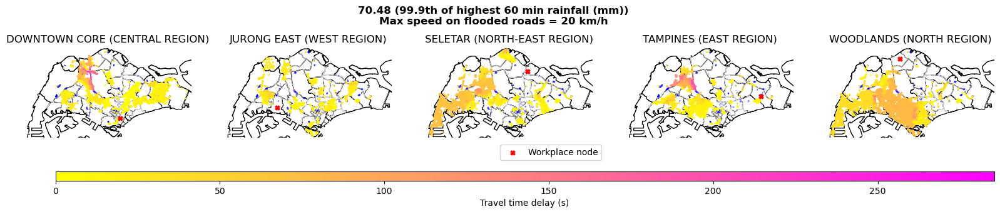

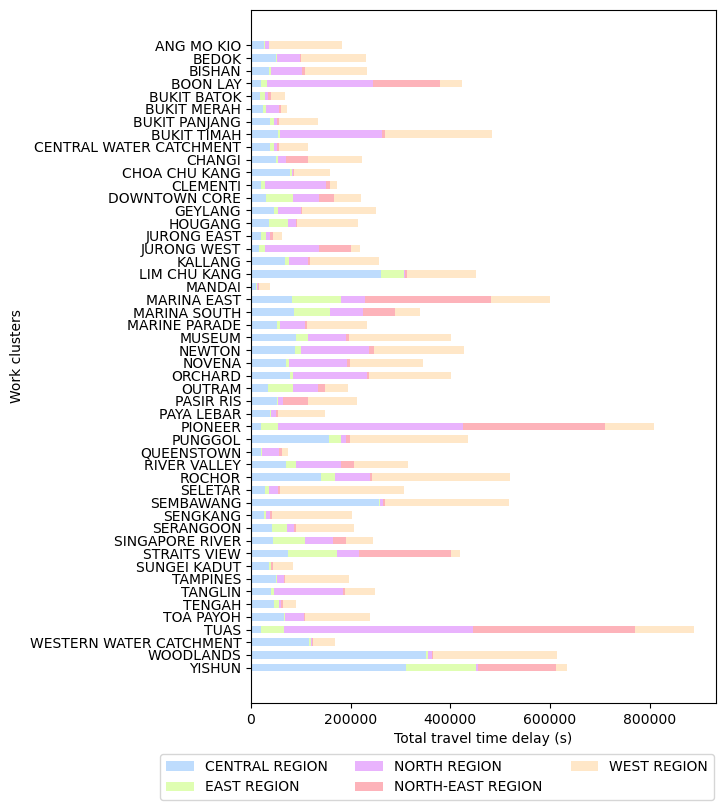

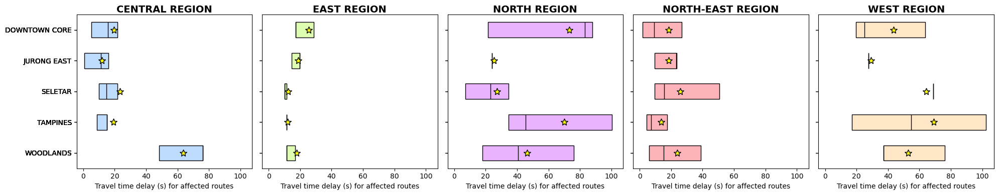

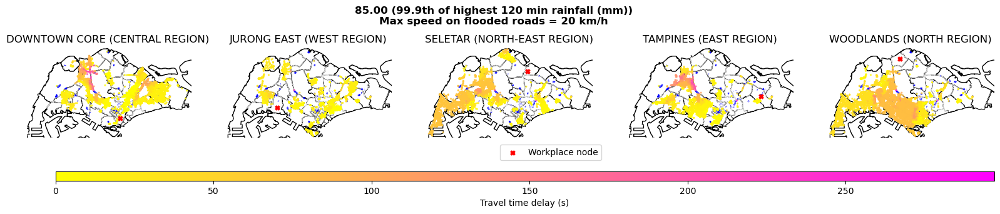

In [46]:
# parameter inputs
save_dir = r"data\floodRouting"

selected_planningArea=['TAMPINES','JURONG EAST','WOODLANDS','DOWNTOWN CORE','SELETAR']

for flooded_maxspeed in [5,20]:
    for rf_type in ['highest 30 min rainfall (mm)','highest 60 min rainfall (mm)','highest 120 min rainfall (mm)']:
        # flooded_maxspeed = int(5)
        # rf_type = 'highest 60 min rainfall (mm)'
        rf_perc = 99.9
        rf_map = {perc:rf_val for perc, rf_val in zip(percentiles,list(historical_ppt_percentiles[rf_type]))}
        rf_value = rf_map[rf_perc]
        
        # get flooded edges
        UFN = floodedRouting.UpdateFloodNetwork(G_car, flooded_maxspeed=flooded_maxspeed)
        # show flooded edges
        flooded_edges = UFN.identify_flooded_roads(historical_floods,rf_value,rf_type=rf_type,plot=False,
                                                flooded_edge_color="red",edge_color="#999999")

        # save fp
        save_fp = os.path.join(save_dir,f"car_routing_rfType{rf_type}_rfPerc{rf_perc}_maxspeed{flooded_maxspeed}.csv")

        # update car network with flooded edges and rerun routing simulation
        UFN = floodedRouting.UpdateFloodNetwork(G_car, flooded_maxspeed=flooded_maxspeed)
        # itinerary df is derived from identifying flooded roads from historically flooded roads, and update travel speed and time in G
        itinerary_df = UFN.get_flooded_car_df(workplace_cluster,planningArea_shp,flooded_edges,
                                            save_fp=save_fp, cost="travel_time")

        # import data and read data
        car_flooded_df = pd.read_csv(save_fp)
        car_dry_df = pd.read_csv(os.path.join(os.getcwd(),"data","car_routing_osmnx_planningArea.csv"))

        # title from plot
        title = f"{rf_value:.2f} ({rf_perc}th of {rf_type})\nMax speed on flooded roads = {flooded_maxspeed} km/h"

        # compute travel time delay
        TTD = floodedRouting.TravelTimeDelay(car_flooded_df,car_dry_df,planningArea_shp,
                                            column_value="simulated_total_duration")

        # compute travel time delay by comparing the difference in dry_df and flooded_df
        travel_time_delay_df = TTD.compute_travel_time_delay()

        # group travel time delay by planning area and region
        itinerary_df_list = TTD.get_grouped_travel_time_delay(travel_time_delay_df)

        # get stats
        save_fp = os.path.join(save_dir,f"car_stats_rfType{rf_type}_rfPerc{rf_perc}_maxspeed{flooded_maxspeed}.csv")
        travelTimeDelay_stats_df = TTD.get_stats_travel_time_delay(travel_time_delay_df, save_fp=save_fp)

        # filter itinerary_df_list by selected planning areas
        selected_itinerary = {k:df for k,df in itinerary_df_list.items() 
                            if k in selected_planningArea}

        # plot horizontal bar chart
        # TTD.plot_total_travel_time_delay(title=title,save_fp=save_fp)
        save_fp = os.path.join(save_dir,f"car_barPlot_timeDelay_rfType{rf_type}_rfPerc{rf_perc}_maxspeed{flooded_maxspeed}.png")
        stacked_bar_results = TTD.plot_total_travel_time_delay(width=0.6,save_fp=save_fp)

        # plot travel time delay by planning area as boxplot
        save_fp = os.path.join(save_dir,f"car_boxPlot_timeDelay_rfType{rf_type}_rfPerc{rf_perc}_maxspeed{flooded_maxspeed}.png")
        boxplot_results = TTD.plot_travel_time_delay_stats(showwhiskers=False, save_fp=save_fp)

        # plot isochrone
        save_fp = os.path.join(save_dir,f"car_isochrone_timeDelay_rfType{rf_type}_rfPerc{rf_perc}_maxspeed{flooded_maxspeed}.png")
        ISO = dryRouting.PlotIsochrone(G_car,travel_time_delay_df,planningArea_shp)
        ISO.plot_isochrone(selected_itinerary,flooded_edges=flooded_edges,
                           column_value="travel_time_delay",
                            cmap="spring_r",flooded_edge_color="blue",
                            colorbar_label="Travel time delay (s)", title=title,
                            save_fp=save_fp)


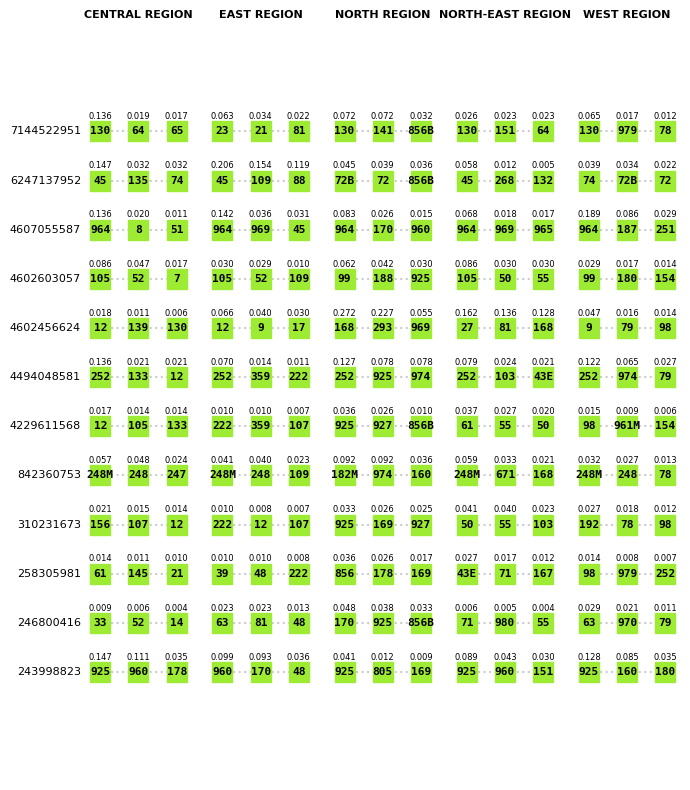

In [572]:
flooded_df = pd.read_csv(r"data\floodRouting\bus_routing_rfTypehighest 30 min rainfall (mm)_rfPerc99.9_maxspeed5.csv")
dry_df = pd.read_csv(r"data\bus_routing_OneMap.csv")
TTD = floodedRouting.TravelTimeDelay(flooded_df,dry_df,planningArea_shp,
                                    column_value="simulated_total_duration",
                                    planningArea_column_value="REGION_N")
# stats_travel_time_delay = TTD.get_stats_travel_time_delay()
# compute stats aggregated by region REGION_N
TTD.plot_bus_services_disruption(save_fp=r"C:\Users\hypak\OneDrive - Singapore Management University\Documents\Projects\Risk Assessment\V3 analysis\data\floodRouting\busServicesDisrupted_rfTypehighest 30 min rainfall (mm)_rfPerc99.9_maxspeed5.png")

In [574]:
flooded_df = pd.read_csv(r"data\floodRouting\bus_routing_rfTypehighest 30 min rainfall (mm)_rfPerc99.9_maxspeed20.csv")
dry_df = pd.read_csv(r"data\bus_routing_OneMap.csv")

# flooded_df = pd.read_csv(r"data\floodRouting\car_routing_rfTypehighest 30 min rainfall (mm)_rfPerc99.9_maxspeed5.csv")
# dry_df = pd.read_csv(r"data\car_routing_osmnx.csv")

len(flooded_df.index)

62764

c:\Users\hypak\OneDrive - Singapore Management University\Documents\Projects\Risk Assessment\V3 analysis\helper_functions\routing\floodedRouting.py:210: UserWarning: Only specify one of 'column' or 'color'. Using 'color'.
  route_times = {k: v for k, v in sorted(route_times.items(), key=lambda item: item[1])}


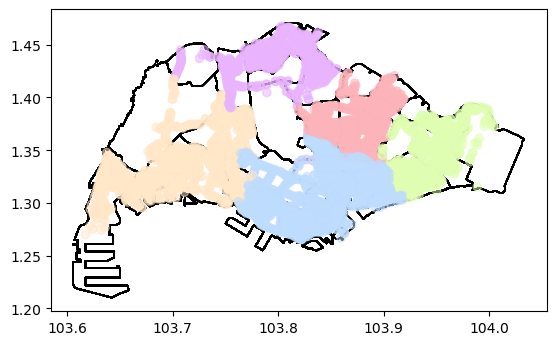

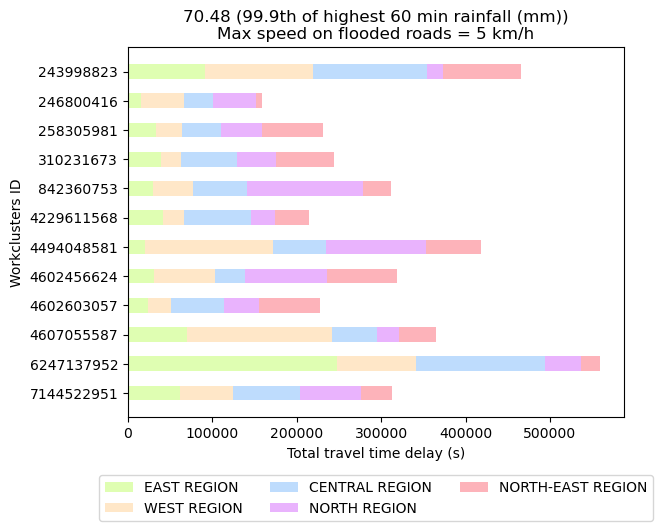

In [274]:
TTD = floodedRouting.TravelTimeDelay(flooded_df,dry_df,planningArea_shp)
TTD.get_planningArea_itinerary(itinerary_df=itinerary_df_list[list(itinerary_df_list)[0]],
                               colors=None,plot=True)
TTD.get_total_travel_time_delay()

# parameter inputs
flooded_maxspeed = int(5)
rf_type = 'highest 60 min rainfall (mm)'
rf_perc = 99.9
rf_map = {perc:rf_val for perc, rf_val in zip(percentiles,list(historical_ppt_percentiles[rf_type]))}
rf_value = rf_map[rf_perc]
# save fp
save_dir = os.path.join(os.getcwd(),"data","floodRouting")
save_fp = os.path.join(save_dir,f"barPlot_bus_routing_rfType{rf_type}_rfPerc{rf_perc}_maxspeed{flooded_maxspeed}.png")
# title from plot
title = f"{rf_value:.2f} ({rf_perc}th of {rf_type})\nMax speed on flooded roads = {flooded_maxspeed} km/h"
TTD.plot_total_travel_time_delay(title=title,save_fp=save_fp)

TODO:
- refactoring of code for private car transport by converting travel time to a dataframe for consistency in analysis for both private and public transit
- compute statistics for travel time delay per planning area